In [1]:
# Importing Libraries

import os

# Data Analysis and Data Visualization
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Setting the style for seaborn
sns.set(style="whitegrid")

# Hypothesis Testing
from scipy import stats
import statsmodels.api as sm

# ML Pre-Processing 
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import pickle

# ML Models
from sklearn.preprocessing import  StandardScaler,OneHotEncoder
from sklearn.ensemble import RandomForestRegressor, BaggingRegressor, AdaBoostRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error,r2_score
from sklearn.exceptions import ConvergenceWarning

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=ConvergenceWarning)

In [2]:
# Load the Dataset

df = pd.read_csv(r"M:\Module - 19 - DSML Portfolio Project\1 - Insurance Cost Prediction\insurance.csv")

In [3]:
df.head()

,Age,Diabetes,BloodPressureProblems,AnyTransplants,AnyChronicDiseases,Height,Weight,KnownAllergies,HistoryOfCancerInFamily,NumberOfMajorSurgeries,PremiumPrice
0,45,0,0,0,0,155,57,0,0,0,25000
1,60,1,0,0,0,180,73,0,0,0,29000
2,36,1,1,0,0,158,59,0,0,1,23000
3,52,1,1,0,1,183,93,0,0,2,28000
4,38,0,0,0,1,166,88,0,0,1,23000


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 986 entries, 0 to 985
Data columns (total 11 columns):
 #   Column                   Non-Null Count  Dtype
---  ------                   --------------  -----
 0   Age                      986 non-null    int64
 1   Diabetes                 986 non-null    int64
 2   BloodPressureProblems    986 non-null    int64
 3   AnyTransplants           986 non-null    int64
 4   AnyChronicDiseases       986 non-null    int64
 5   Height                   986 non-null    int64
 6   Weight                   986 non-null    int64
 7   KnownAllergies           986 non-null    int64
 8   HistoryOfCancerInFamily  986 non-null    int64
 9   NumberOfMajorSurgeries   986 non-null    int64
 10  PremiumPrice             986 non-null    int64
dtypes: int64(11)
memory usage: 84.9 KB


In [5]:
# Standardize a few expected column names

df = df.rename(columns={
    "PremiumPrice":"Premium_Price",
    "BloodPressureProblems":"Blood_Pressure_Problems",
    "AnyChronicDiseases":"Any_Chronic_Diseases",
    "AnyTransplants":"Any_Transplants",
    "HistoryOfCancerInFamily":"History_of_Cancer_in_Family",
    "KnownAllergies":"Known_Allergies",
    "NumberOfMajorSurgeries":"Number_of_Major_Surgeries"
})

In [6]:
# Identify columns
TARGET = "Premium_Price"
binary_cols = [c for c in df.columns if set(df[c].dropna().unique()).issubset({0,1})]
cont_cols = [c for c in df.columns if c not in binary_cols]

In [7]:
df.columns

Index(['Age', 'Diabetes', 'Blood_Pressure_Problems', 'Any_Transplants',
       'Any_Chronic_Diseases', 'Height', 'Weight', 'Known_Allergies',
       'History_of_Cancer_in_Family', 'Number_of_Major_Surgeries',
       'Premium_Price'],
      dtype='object')

In [8]:
binary_cols

['Diabetes',
 'Blood_Pressure_Problems',
 'Any_Transplants',
 'Any_Chronic_Diseases',
 'Known_Allergies',
 'History_of_Cancer_in_Family']

In [9]:
cont_cols

['Age', 'Height', 'Weight', 'Number_of_Major_Surgeries', 'Premium_Price']

In [10]:
def num_summary(frame, cols):
    """
    Returns a summary table with count, mean, std, min, median, max, skew, kurtosis, missing%.
    """
    out = frame[cols].agg(['count','mean','std','min','median','max']).T
    out['missing%'] = 100 * (1 - out['count']/len(frame))
    out['skew'] = frame[cols].skew()
    out['kurtosis'] = frame[cols].kurtosis()
    return out.round(3)

summary_cont = num_summary(df, cont_cols)
summary_bin = df[binary_cols].sum().to_frame(name="Yes") #* Yes is Count of 1s
summary_bin["No"] = len(df) - summary_bin["Yes"] #* No is Count of 0s


print("Continuous Variables Summary:")
display(summary_cont)

print("\nBinary Variables Summary:")
display(summary_bin)

Continuous Variables Summary:


,count,mean,std,min,median,max,missing%,skew,kurtosis
Age,986.0,41.745,13.963,18.0,42.0,66.0,0.0,0.030,-1.132
Height,986.0,168.183,10.098,145.0,168.0,188.0,0.0,-0.180,-0.762
Weight,986.0,76.950,14.265,51.0,75.0,132.0,0.0,0.667,0.610
Number_of_Major_Surgeries,986.0,0.667,0.749,0.0,1.0,3.0,0.0,0.861,0.066
Premium_Price,986.0,24336.714,6248.184,15000.0,23000.0,40000.0,0.0,0.098,-0.453



Binary Variables Summary:


,Yes,No
Diabetes,414,572
Blood_Pressure_Problems,462,524
Any_Transplants,55,931
Any_Chronic_Diseases,178,808
Known_Allergies,212,774
History_of_Cancer_in_Family,116,870


In [11]:
df.describe(include='all')

,Age,Diabetes,Blood_Pressure_Problems,Any_Transplants,Any_Chronic_Diseases,Height,Weight,Known_Allergies,History_of_Cancer_in_Family,Number_of_Major_Surgeries,Premium_Price
count,986.000000,986.000000,986.000000,986.000000,986.000000,986.000000,986.000000,986.000000,986.000000,986.000000,986.000000
mean,41.745436,0.419878,0.468560,0.055781,0.180527,168.182556,76.950304,0.215010,0.117647,0.667343,24336.713996
std,13.963371,0.493789,0.499264,0.229615,0.384821,10.098155,14.265096,0.411038,0.322353,0.749205,6248.184382
min,18.000000,0.000000,0.000000,0.000000,0.000000,145.000000,51.000000,0.000000,0.000000,0.000000,15000.000000
25%,30.000000,0.000000,0.000000,0.000000,0.000000,161.000000,67.000000,0.000000,0.000000,0.000000,21000.000000
50%,42.000000,0.000000,0.000000,0.000000,0.000000,168.000000,75.000000,0.000000,0.000000,1.000000,23000.000000
75%,53.000000,1.000000,1.000000,0.000000,0.000000,176.000000,87.000000,0.000000,0.000000,1.000000,28000.000000
max,66.000000,1.000000,1.000000,1.000000,1.000000,188.000000,132.000000,1.000000,1.000000,3.000000,40000.000000


## 2.2 - Distribution Analysis

Here we are Going to Perform - 

- Histograms, KDE plots for continuous vars

- Bar plots for binary vars

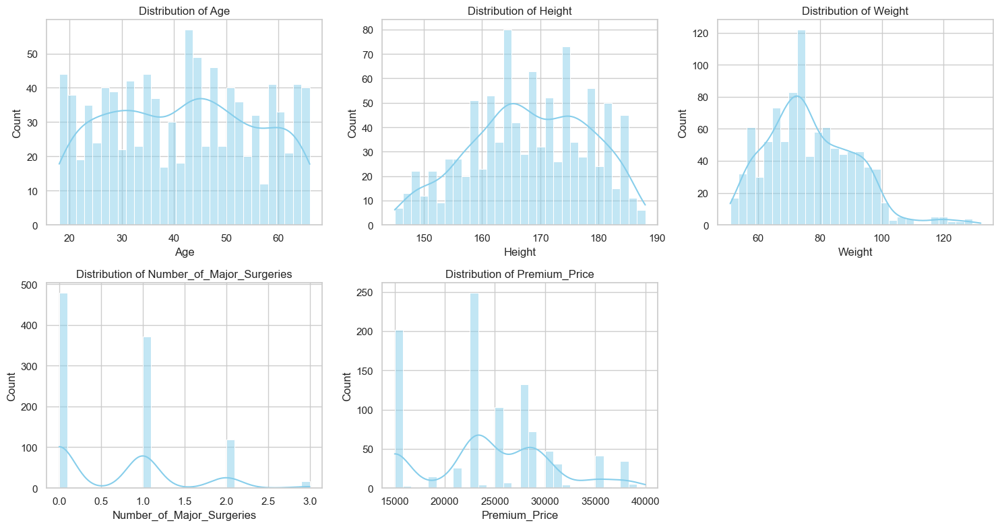

In [12]:
# Histograms for Continuous Variables

def plot_continuous_distributions(data, cols):
    n = len(cols)
    rows = int(np.ceil(n/3))
    plt.figure(figsize=(15, 4*rows))

    for i, col in enumerate(cols, 1):
        plt.subplot(rows, 3, i)
        sns.histplot(data[col], kde=True, bins=30, color="skyblue")
        plt.title(f"Distribution of {col}")
    
    plt.tight_layout()
    plt.show()

plot_continuous_distributions(df, cont_cols)

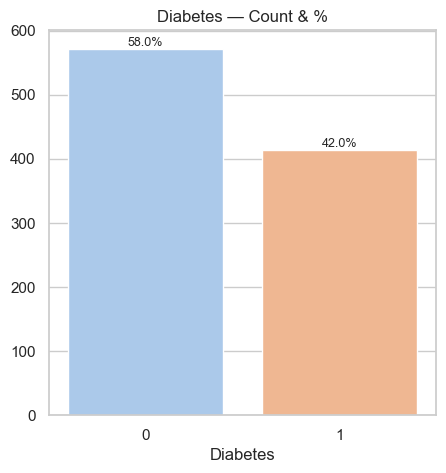

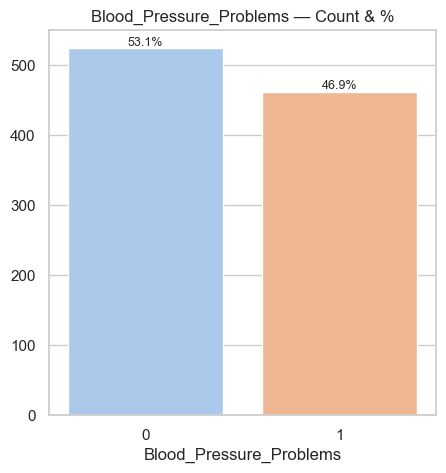

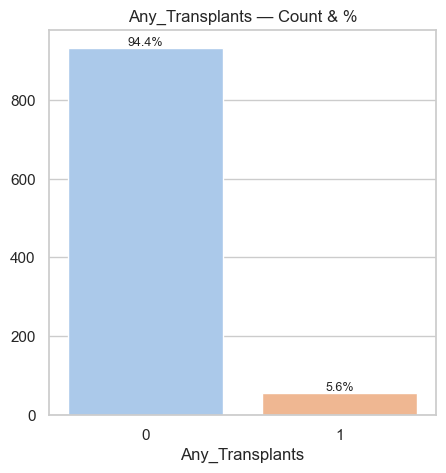

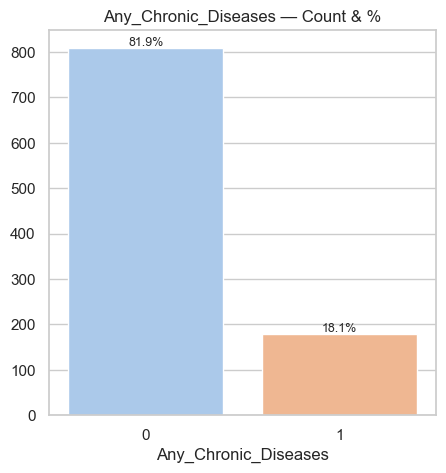

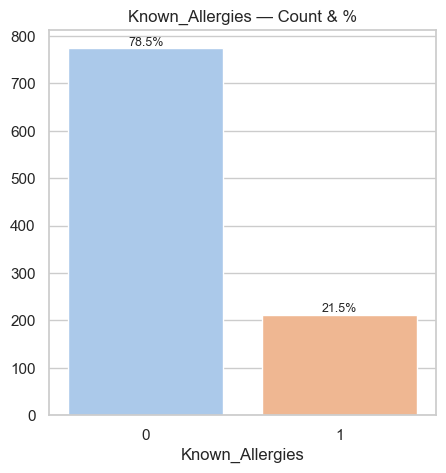

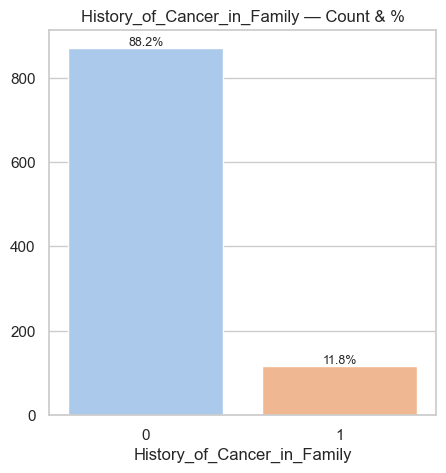

In [13]:
# Binary Variable Bar Plots

def plot_binary_distribution(data, col):
    counts = data[col].value_counts().sort_index()
    pct = 100 * counts / counts.sum()

    fig, ax = plt.subplots(figsize=(5,5))
    sns.barplot(x=counts.index.astype(str), y=counts.values, palette="pastel", ax=ax)
    ax.set_title(f"{col} — Count & %")
    for i, v in enumerate(counts.values):
        ax.text(i, v, f"{pct.iloc[i]:.1f}%", ha='center', va='bottom', fontsize=9)
    plt.show()

for col in binary_cols:
    plot_binary_distribution(df, col)

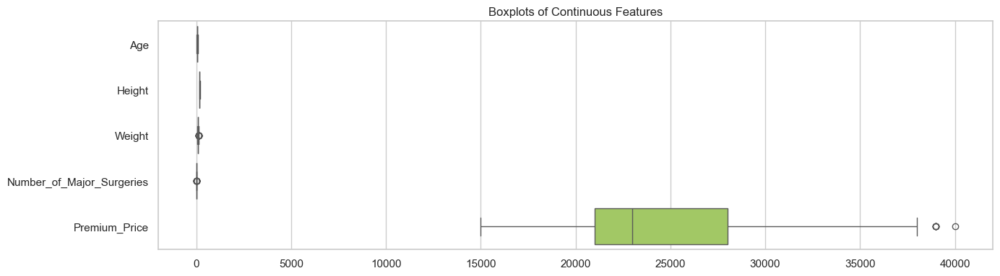

In [14]:
# Boxplot for Continuous Variables

def plot_boxplots(data, cols):
    plt.figure(figsize=(14, max(4, 0.5*len(cols))))
    sns.boxplot(data=data[cols], orient="h", palette="Set2")
    plt.title("Boxplots of Continuous Features")
    plt.tight_layout()
    plt.show()

plot_boxplots(df, cont_cols)

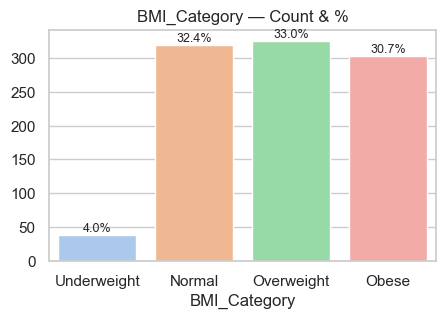

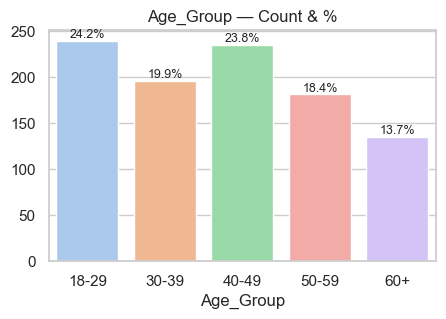

In [15]:
# Engineered Values

# Helper function for barplot with % labels
def plot_category_distribution(data, col, palette="pastel"):
    counts = data[col].value_counts().sort_index()
    pct = 100 * counts / counts.sum()

    fig, ax = plt.subplots(figsize=(5,3))
    sns.barplot(x=counts.index.astype(str), y=counts.values, palette=palette, ax=ax)
    ax.set_title(f"{col} — Count & %")

    for i, v in enumerate(counts.values):
        ax.text(i, v, f"{pct.iloc[i]:.1f}%", ha='center', va='bottom', fontsize=9)
    plt.show()

# ✅ BMI
df['BMI'] = df['Weight'] / ((df['Height']/100)**2)
bmi_bins = [0, 18.5, 25, 30, np.inf]
bmi_labels = ['Underweight','Normal','Overweight','Obese']
df['BMI_Category'] = pd.cut(df['BMI'], bins=bmi_bins, labels=bmi_labels, right=False)

plot_category_distribution(df, 'BMI_Category')

# ✅ Age groups
age_bins = [18, 30, 40, 50, 60, np.inf]
age_labels = ['18-29','30-39','40-49','50-59','60+']
df['Age_Group'] = pd.cut(df['Age'], bins=age_bins, labels=age_labels, right=False)

plot_category_distribution(df, 'Age_Group')


## 2.3 - Correlation Heatmap

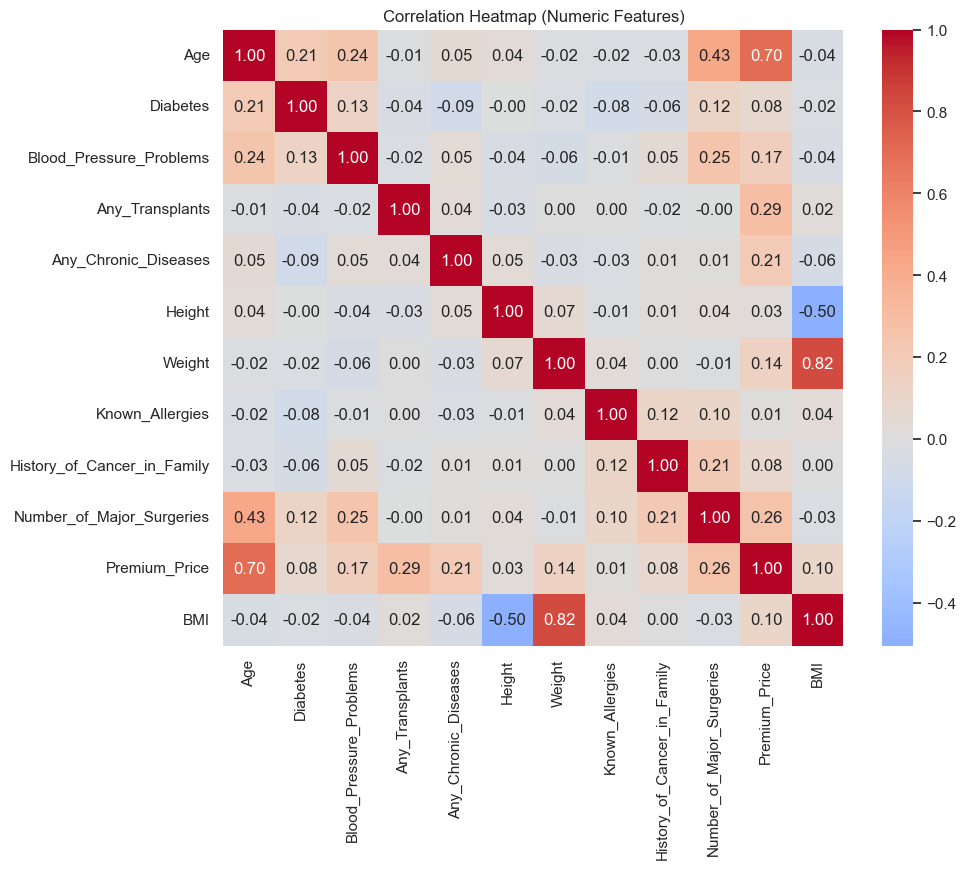

🔎 Correlation of Features with PremiumPrice:


Age                            0.697540
Any_Transplants                0.289056
Number_of_Major_Surgeries      0.264250
Any_Chronic_Diseases           0.208610
Blood_Pressure_Problems        0.167097
Weight                         0.141507
BMI                            0.103812
History_of_Cancer_in_Family    0.083139
Diabetes                       0.076209
Height                         0.026910
Known_Allergies                0.012103
Name: Premium_Price, dtype: float64

In [16]:
# Heatmap of Correlation

def plot_corr_heatmap(data, target=TARGET):
    corr = data.corr(numeric_only=True)
    
    plt.figure(figsize=(10,8))
    sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", center=0)
    plt.title("Correlation Heatmap (Numeric Features)")
    plt.show()
    
    # Sort features by correlation with target
    target_corr = corr[target].drop(target).sort_values(ascending=False)
    print("🔎 Correlation of Features with PremiumPrice:")
    display(target_corr)

plot_corr_heatmap(df)

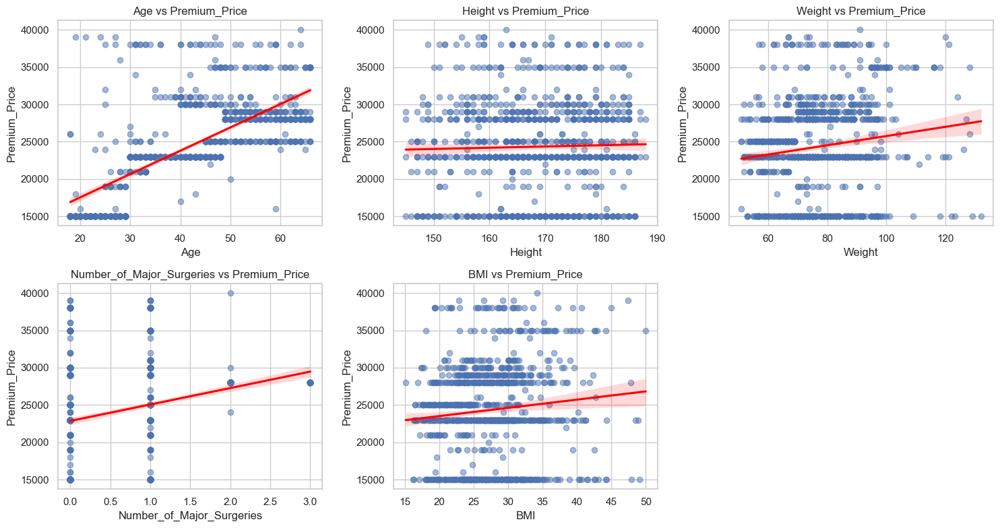

In [17]:
# Premium VS Continuous Features

def plot_scatter_vs_target(data, cols, target=TARGET):
    rows = int(np.ceil(len(cols)/3))
    plt.figure(figsize=(15, 4*rows))
    
    for i, col in enumerate(cols, 1):
        plt.subplot(rows, 3, i)
        sns.regplot(x=col, y=target, data=data, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
        plt.title(f"{col} vs {target}")
    
    plt.tight_layout()
    plt.show()

cont_features = [c for c in cont_cols if c != TARGET] + ['BMI']
plot_scatter_vs_target(df, cont_features)


In [18]:
cont_cols

['Age', 'Height', 'Weight', 'Number_of_Major_Surgeries', 'Premium_Price']

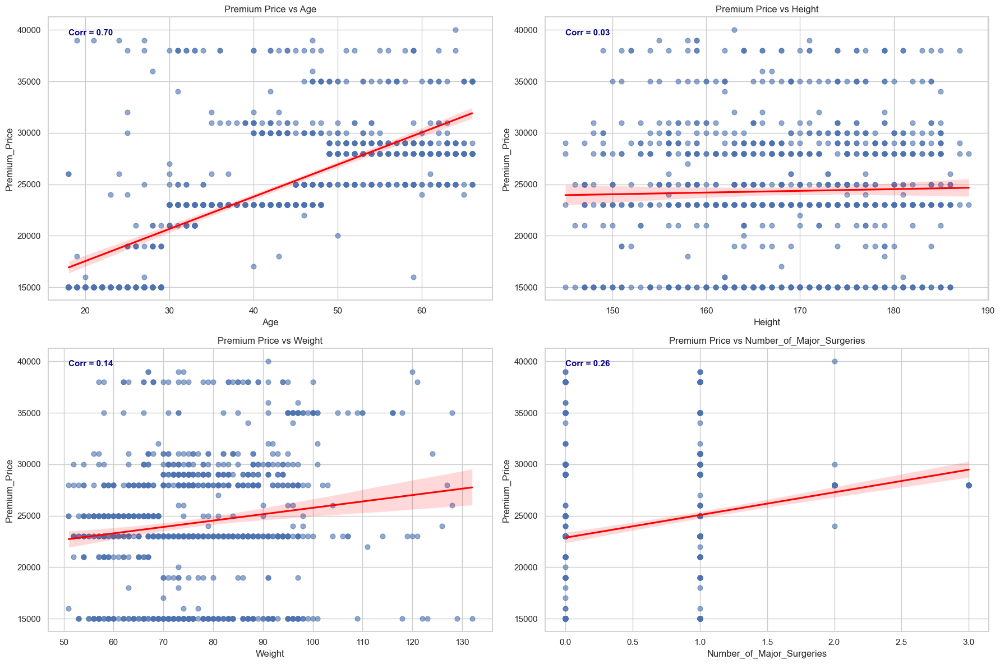

In [19]:
# Premium vs Continuous Features (Scatterplots + Correlation Annotations)

Continuous_cols = ['Age', 'Height', 'Weight', 'Number_of_Major_Surgeries']

# Plot regression scatter plots with CI
plt.figure(figsize=(18, 12))

for idx, col in enumerate(Continuous_cols, 1):
    plt.subplot(2, 2, idx)
    plt.title(f"Premium Price vs {col}", fontsize=12)
    sns.regplot(
        x=df[col], y=df['Premium_Price'],
        scatter_kws={'alpha':0.6, 's':40},  # keep all points visible
        line_kws={'color':'red'}, ci=95 # Regression line (red) + shaded 95% CI
    )
    
    # --- Correlation Annotation ---
    corr = df[[col, 'Premium_Price']].corr().iloc[0,1]
    plt.text(df[col].min(), df['Premium_Price'].max()-500,
             f"Corr = {corr:.2f}", fontsize=11, fontweight="bold", color="darkblue")



plt.tight_layout()
plt.show()

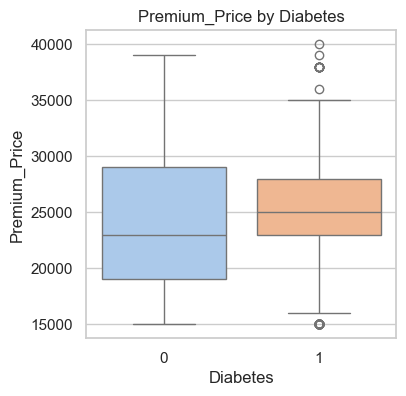

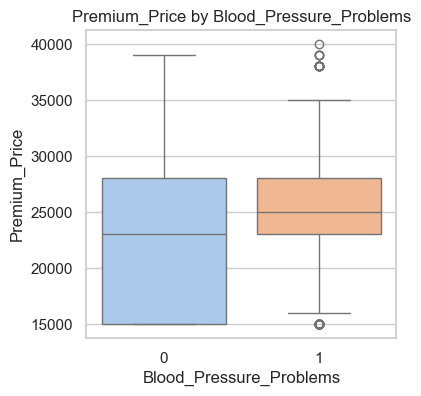

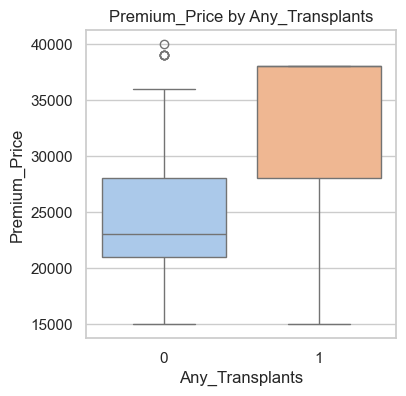

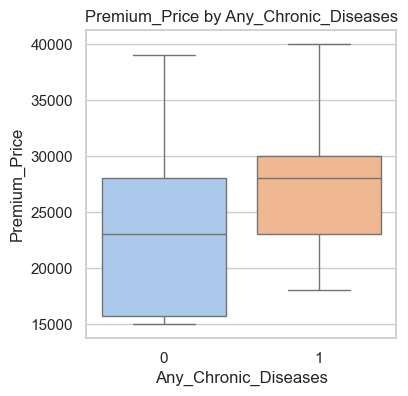

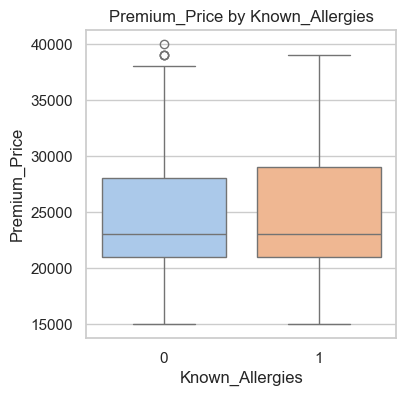

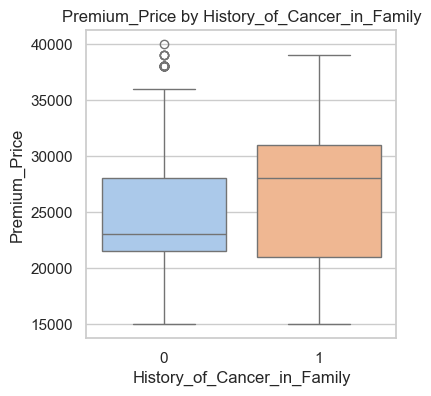

In [20]:
# Premium VS Binary Features

def plot_box_vs_target(data, cols, target=TARGET):
    for col in cols:
        plt.figure(figsize=(4,4))
        sns.boxplot(x=col, y=target, data=data, palette="pastel")
        plt.title(f"{target} by {col}")
        plt.show()

plot_box_vs_target(df, binary_cols)

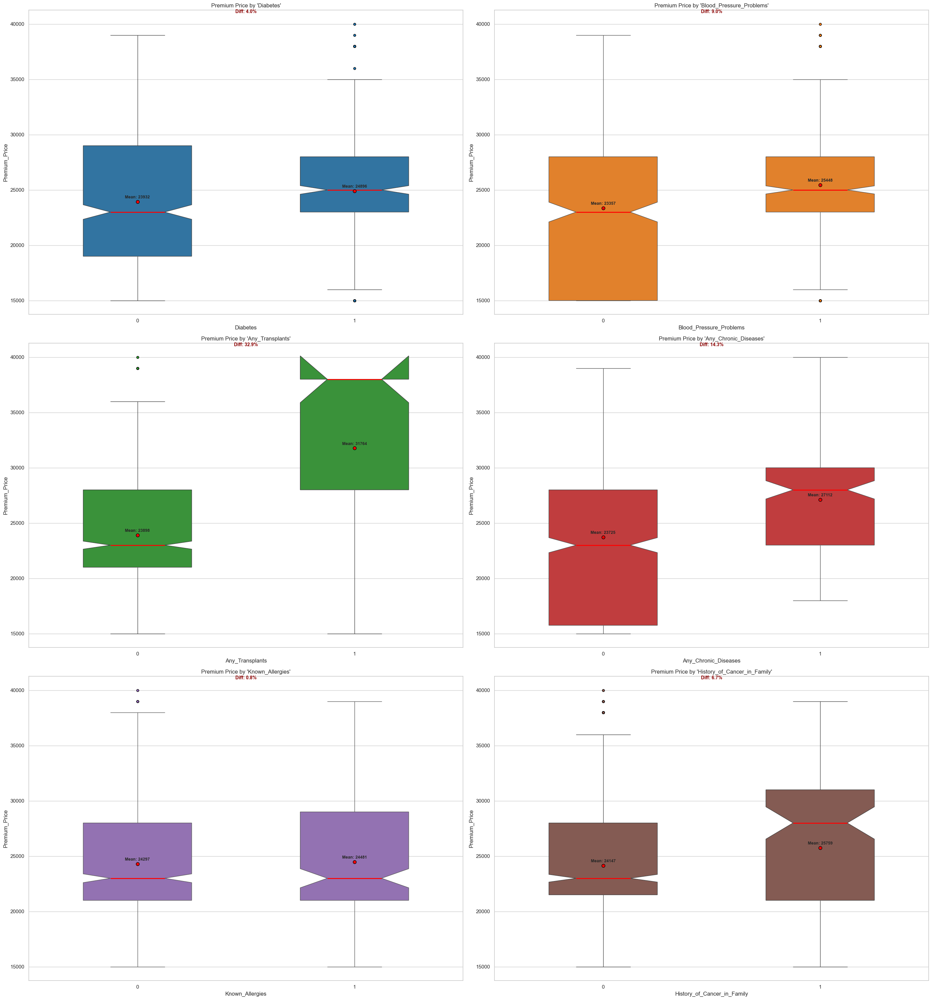

In [21]:
# Premium vs Binary Features (Boxplots + % Difference)

# Custom Colors
Colors_Palette = ["#1f77b4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd", "#8c564b"]

# Boxplots for Binary Features vs Premium Price
plt.figure(figsize=(28, 30))
count = 1

for i, col in enumerate(binary_cols):
    plt.subplot(3, 2, count)
    plt.title(f"Premium Price by '{col}'", fontsize=12)
    
    sns.boxplot(
        data=df,
        x=col,
        y='Premium_Price',
        color=Colors_Palette[i],
        width=0.5,
        fliersize=5,
        notch=True,
        showcaps=True,
        linewidth=1,
        showmeans=True,
        meanprops={'marker': 'o',
                   'markerfacecolor': 'red',
                   'markeredgecolor': 'black',
                   'markersize': 7},
        medianprops={"color": "red", "linewidth": 2},
        flierprops={'marker': 'o',
                    'markersize': 5,
                    'markerfacecolor': Colors_Palette[i],
                    'markeredgecolor': 'black',
                    "linewidth": 1.5}
    )
    
    # --- Add Mean Values + % Difference ---
    mean_vals = df.groupby(col)['Premium_Price'].mean()
    diff_pct = ((mean_vals[1] - mean_vals[0]) / mean_vals[0]) * 100 if 1 in mean_vals.index else 0
    
    for j, val in enumerate(mean_vals):
        plt.text(j, val+300, f"Mean: {val:.0f}", ha='center', fontsize=9, fontweight="bold")
    
    if 1 in mean_vals.index:  # Add % diff only if both 0 and 1 present
        plt.text(0.5, max(df['Premium_Price'])+1000,
                 f"Diff: {diff_pct:.1f}%",
                 ha='center', fontsize=10, color="darkred", fontweight="bold")

    count += 1

plt.tight_layout()
plt.show()



## Decide ????


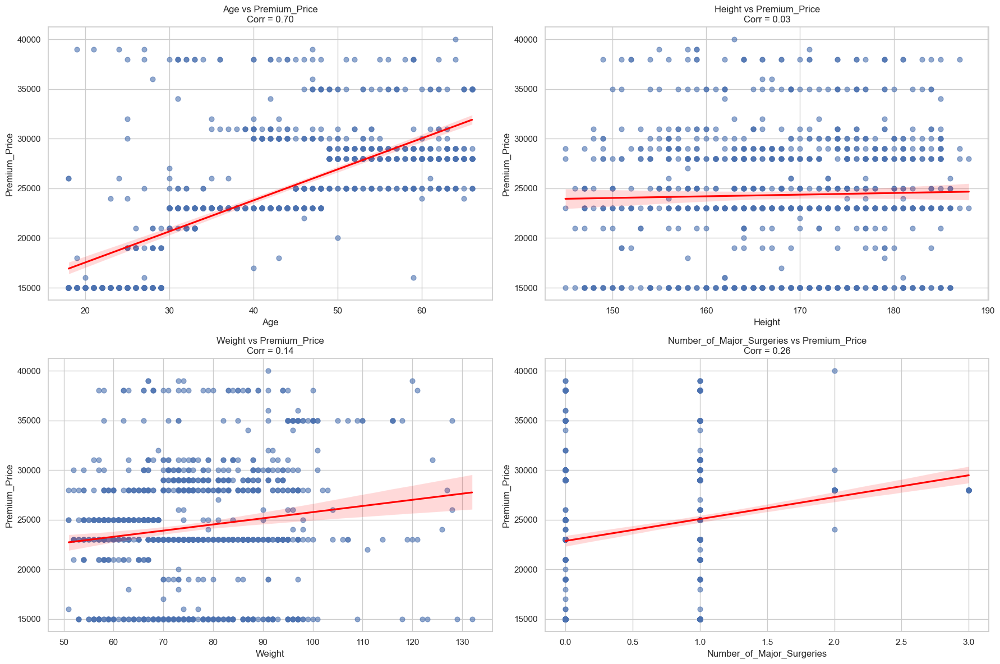

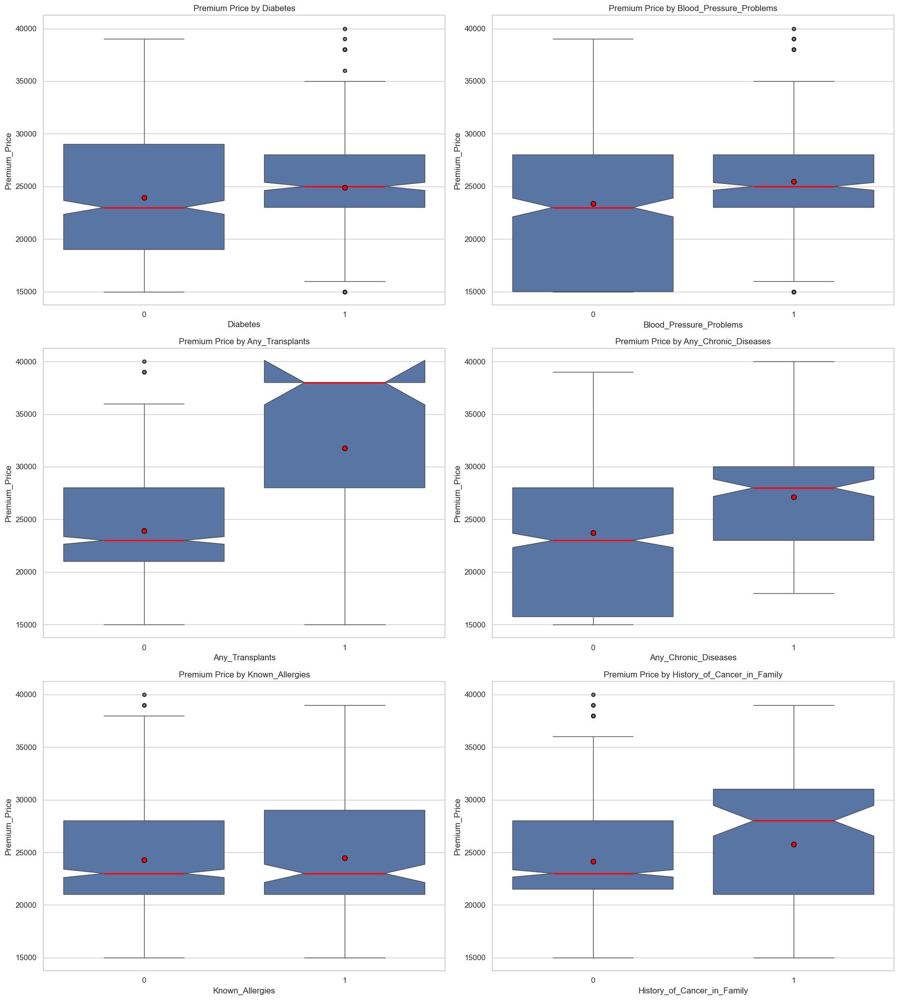

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns

# ---- Continuous Features ----
cont_cols = ['Age', 'Height', 'Weight', 'Number_of_Major_Surgeries']

plt.figure(figsize=(18, 12))
for idx, col in enumerate(cont_cols, 1):
    plt.subplot(2, 2, idx)
    sns.regplot(
        x=df[col], y=df['Premium_Price'],
        scatter_kws={'alpha':0.6, 's':40},  # show all points clearly
        line_kws={'color':'red'}, ci=95
    )
    corr = df[col].corr(df['Premium_Price'])
    plt.title(f"{col} vs Premium_Price\nCorr = {corr:.2f}", fontsize=12)

plt.tight_layout()
plt.show()


# ---- Binary Features ----
binary_cols = [
    'Diabetes', 'Blood_Pressure_Problems', 'Any_Transplants',
    'Any_Chronic_Diseases', 'Known_Allergies', 'History_of_Cancer_in_Family'
]

plt.figure(figsize=(18, 20))
for idx, col in enumerate(binary_cols, 1):
    plt.subplot(3, 2, idx)
    sns.boxplot(
        x=df[col], y=df['Premium_Price'],
        notch=True, showmeans=True,
        meanprops={'marker': 'o','markerfacecolor': 'red',
                   'markeredgecolor': 'black','markersize': '7'},
        medianprops={"color": "red", "linewidth": 2},
        flierprops={'marker': 'o','markersize': '5',
                    'markerfacecolor': 'gray','markeredgecolor': 'black'}
    )
    plt.title(f"Premium Price by {col}", fontsize=12)

plt.tight_layout()
plt.show()


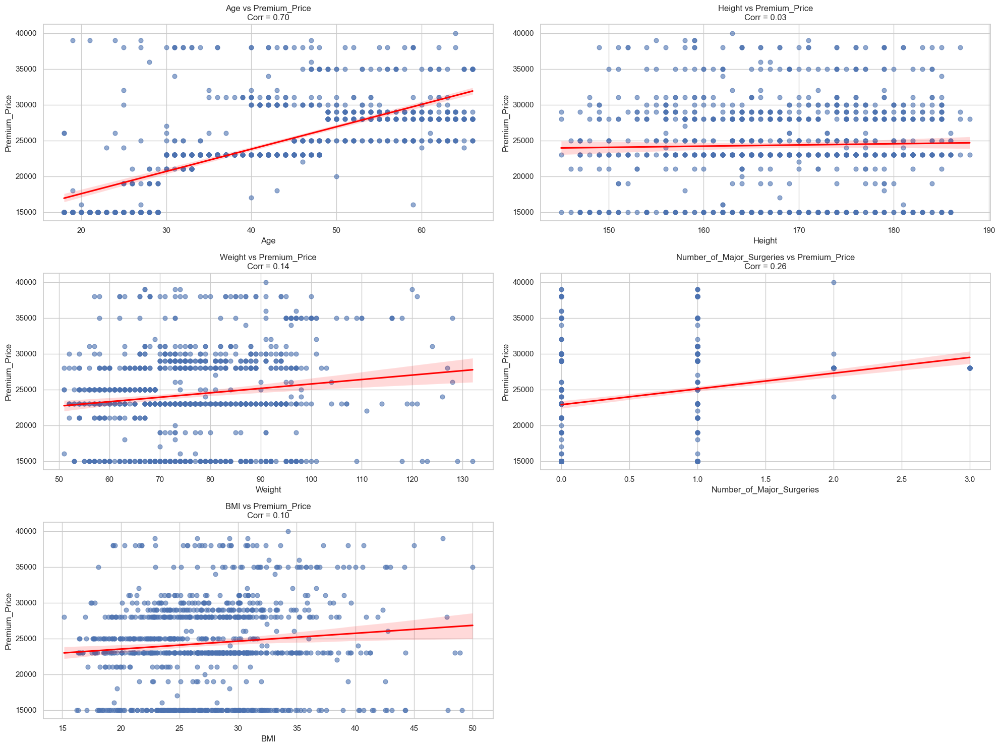

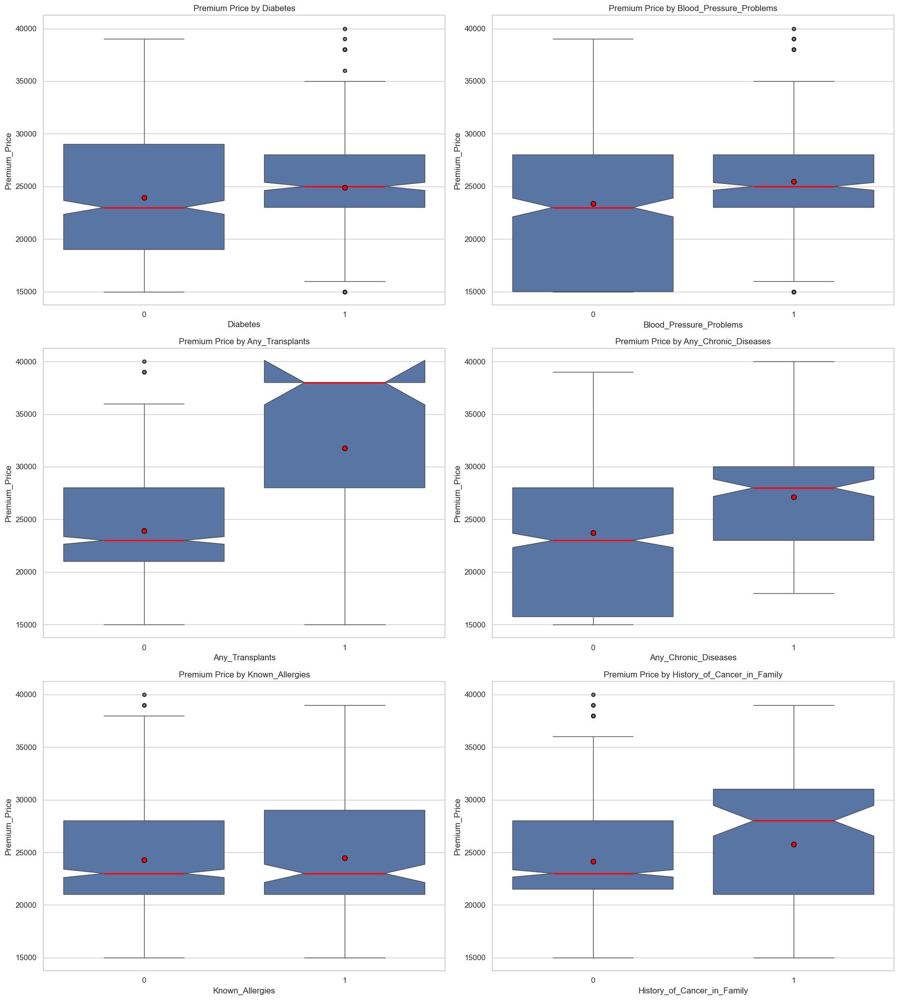

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns

# ---- Step 1: Engineer BMI ----
df['BMI'] = df['Weight'] / ((df['Height']/100) ** 2)

# ---- Step 2: Continuous Features (including BMI) ----
cont_cols = ['Age', 'Height', 'Weight', 'Number_of_Major_Surgeries', 'BMI']

plt.figure(figsize=(20, 15))
for idx, col in enumerate(cont_cols, 1):
    plt.subplot(3, 2, idx)
    sns.regplot(
        x=df[col], y=df['Premium_Price'],
        scatter_kws={'alpha':0.6, 's':40},
        line_kws={'color':'red'}, ci=95
    )
    corr = df[col].corr(df['Premium_Price'])
    plt.title(f"{col} vs Premium_Price\nCorr = {corr:.2f}", fontsize=12)

plt.tight_layout()
plt.show()


# ---- Step 3: Binary Features ----
binary_cols = [
    'Diabetes', 'Blood_Pressure_Problems', 'Any_Transplants',
    'Any_Chronic_Diseases', 'Known_Allergies', 'History_of_Cancer_in_Family'
]

plt.figure(figsize=(18, 20))
for idx, col in enumerate(binary_cols, 1):
    plt.subplot(3, 2, idx)
    sns.boxplot(
        x=df[col], y=df['Premium_Price'],
        notch=True, showmeans=True,
        meanprops={'marker': 'o','markerfacecolor': 'red',
                   'markeredgecolor': 'black','markersize': 7},
        medianprops={"color": "red", "linewidth": 2},
        flierprops={'marker': 'o','markersize': 5,
                    'markerfacecolor': 'gray','markeredgecolor': 'black'}
    )
    plt.title(f"Premium Price by {col}", fontsize=12)

plt.tight_layout()
plt.show()


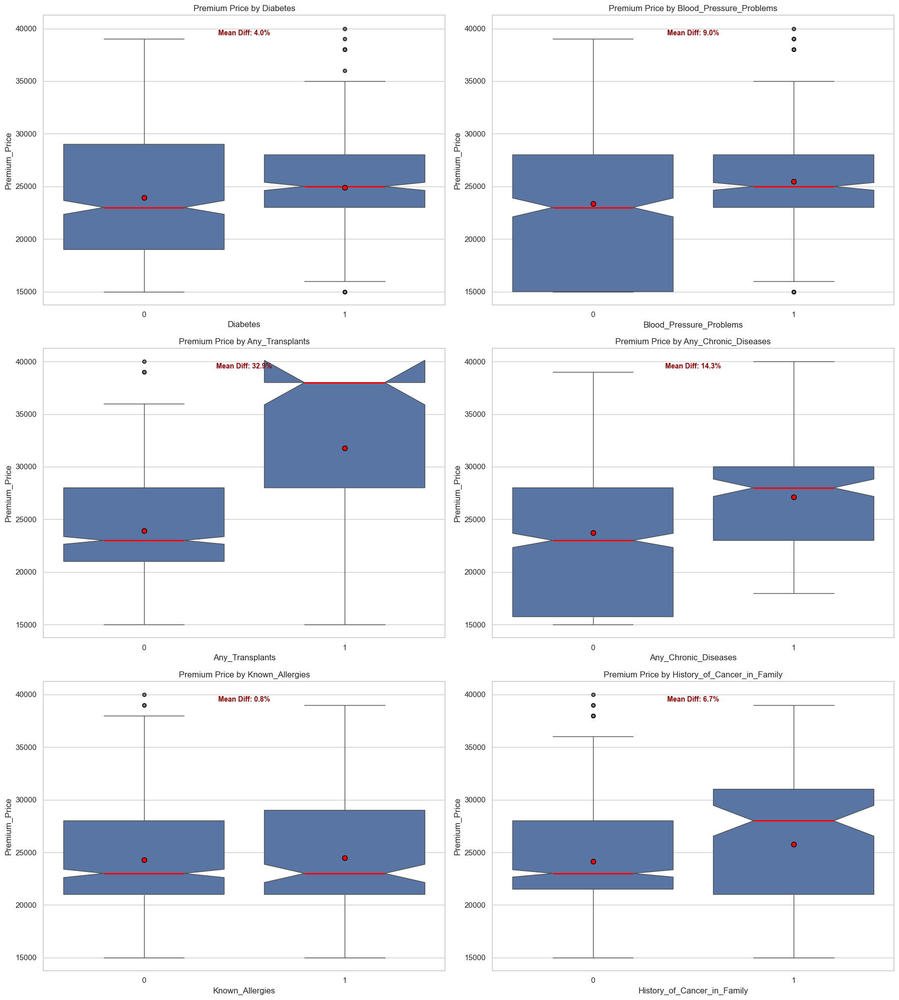

In [24]:
plt.figure(figsize=(18, 20))

for idx, col in enumerate(binary_cols, 1):
    plt.subplot(3, 2, idx)
    sns.boxplot(
        x=df[col], y=df['Premium_Price'],
        notch=True, showmeans=True,
        meanprops={'marker': 'o','markerfacecolor': 'red',
                   'markeredgecolor': 'black','markersize': 7},
        medianprops={"color": "red", "linewidth": 2},
        flierprops={'marker': 'o','markersize': 5,
                    'markerfacecolor': 'gray','markeredgecolor': 'black'}
    )

    # calculate means for both groups
    means = df.groupby(col)['Premium_Price'].mean()
    if len(means) == 2:  # only annotate if both 0 and 1 exist
        diff_pct = ((means[1] - means[0]) / means[0]) * 100
        plt.text(
            0.5, max(df['Premium_Price']) * 0.98,
            f"Mean Diff: {diff_pct:.1f}%",
            ha='center', va='bottom', fontsize=10, color='darkred', weight='bold'
        )

    plt.title(f"Premium Price by {col}", fontsize=12)

plt.tight_layout()
plt.show()


Now, a “Mean Diff: X%” annotation appears above, showing the % difference in average premium between those with (1) vs without (0) the condition.

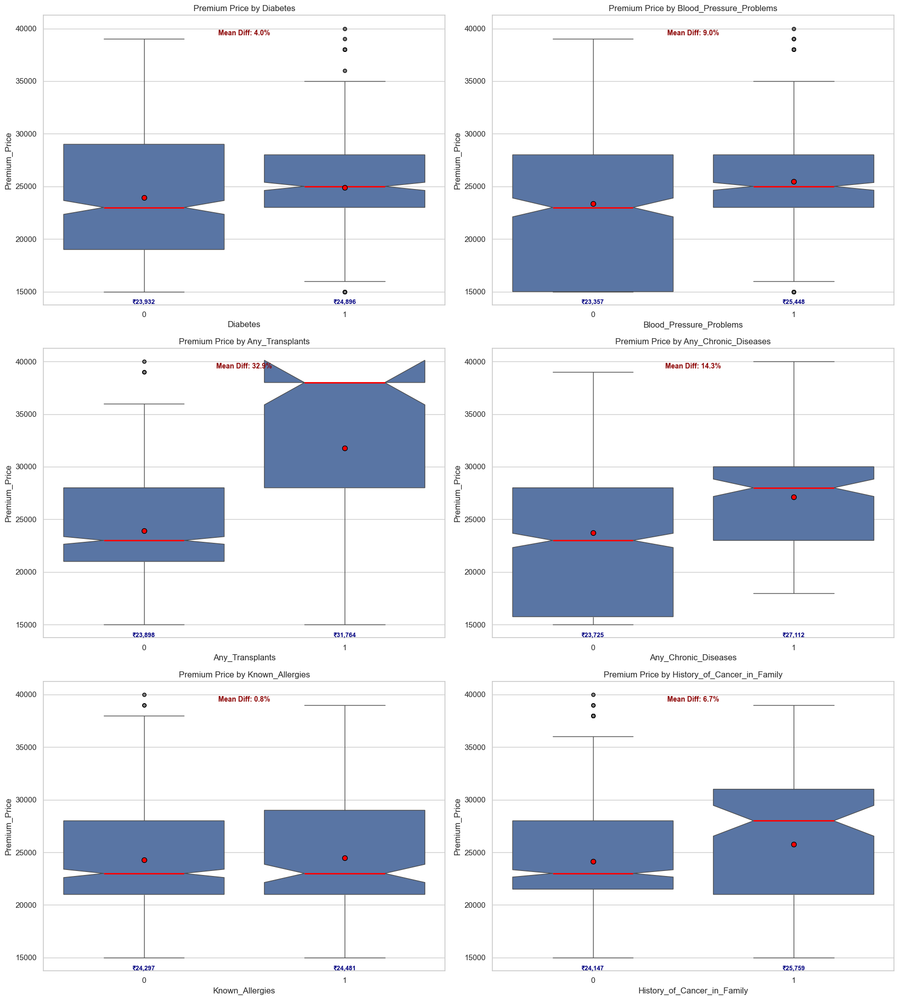

In [25]:
plt.figure(figsize=(18, 20))

for idx, col in enumerate(binary_cols, 1):
    plt.subplot(3, 2, idx)
    sns.boxplot(
        x=df[col], y=df['Premium_Price'],
        notch=True, showmeans=True,
        meanprops={'marker': 'o','markerfacecolor': 'red',
                   'markeredgecolor': 'black','markersize': 7},
        medianprops={"color": "red", "linewidth": 2},
        flierprops={'marker': 'o','markersize': 5,
                    'markerfacecolor': 'gray','markeredgecolor': 'black'}
    )

    # calculate means for both groups
    means = df.groupby(col)['Premium_Price'].mean()
    if len(means) == 2:  
        diff_pct = ((means[1] - means[0]) / means[0]) * 100

        # annotate percentage difference at the top
        plt.text(
            0.5, max(df['Premium_Price']) * 0.98,
            f"Mean Diff: {diff_pct:.1f}%",
            ha='center', va='bottom', fontsize=10, color='darkred', weight='bold'
        )

        # annotate actual mean values under each box
        for x_pos, val in enumerate(means):
            plt.text(
                x_pos, df['Premium_Price'].min() * 0.95,
                f"₹{val:,.0f}",  # formatted with commas
                ha='center', va='top', fontsize=9, color='navy', weight='bold'
            )

    plt.title(f"Premium Price by {col}", fontsize=12)

plt.tight_layout()
plt.show()


## Pairplots

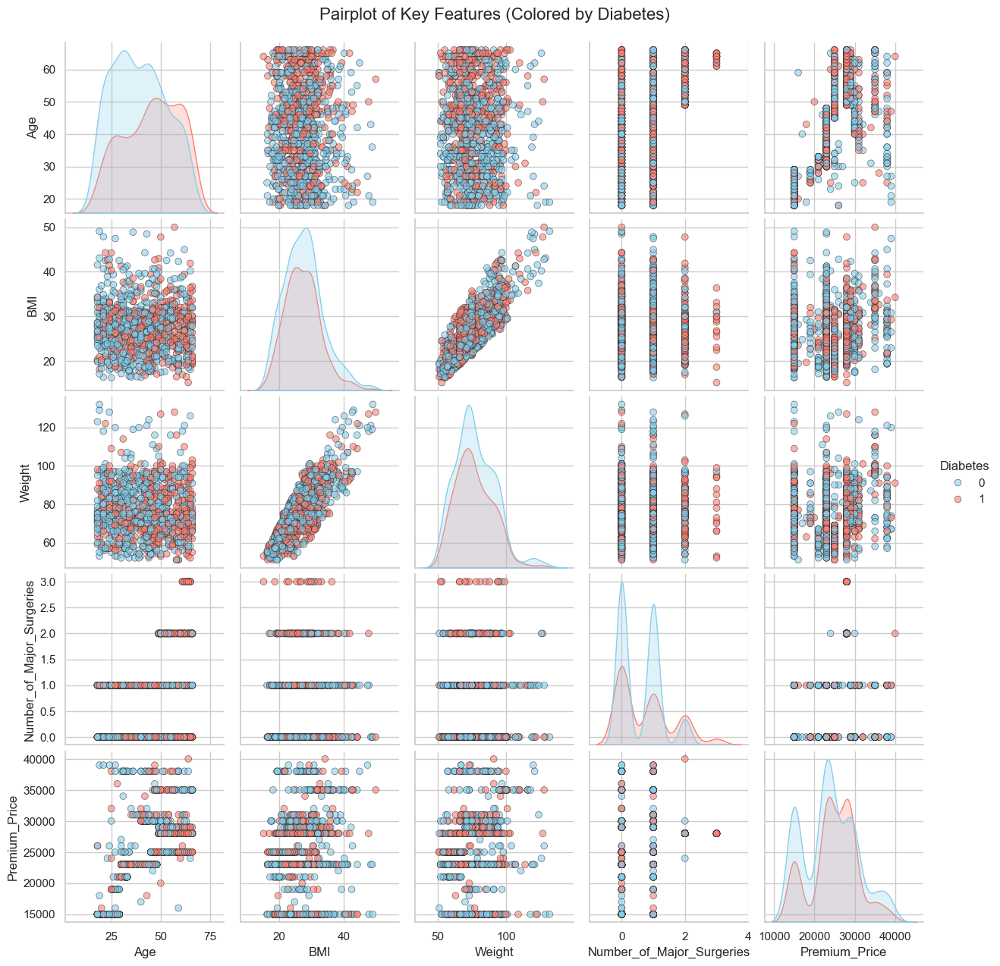

In [26]:
# Pairplots for Key Features

# Select key features for pairplot
pairplot_cols = ['Age', 'BMI', 'Weight', 'Number_of_Major_Surgeries', 'Premium_Price']

# Pairplot with hue for Diabetes
sns.pairplot(
    df[pairplot_cols + ['Diabetes']], 
    hue='Diabetes',
    diag_kind="kde",
    palette={0: "skyblue", 1: "salmon"},
    plot_kws={'alpha':0.6, 's':40, 'edgecolor':'k'}
)

plt.suptitle("Pairplot of Key Features (Colored by Diabetes)", y=1.02, fontsize=16)
plt.show()

Generating Pairplot for: Diabetes...


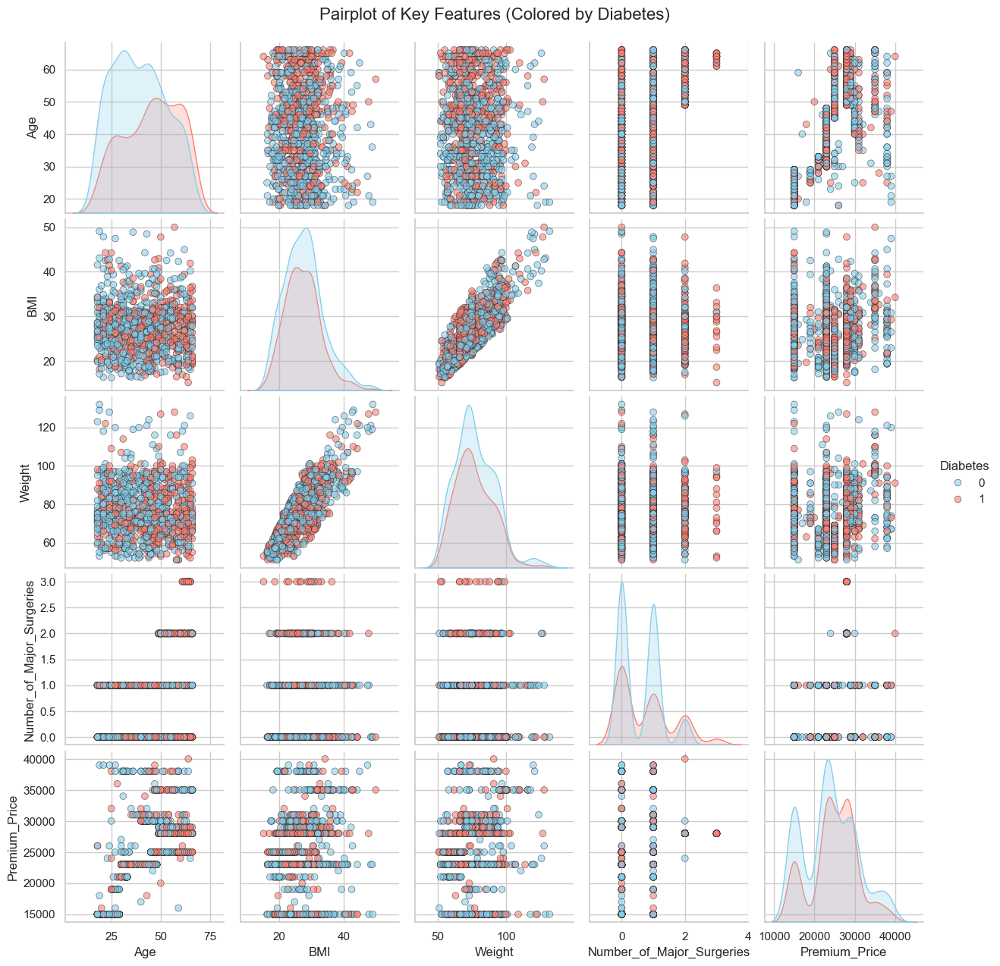

Generating Pairplot for: Blood_Pressure_Problems...


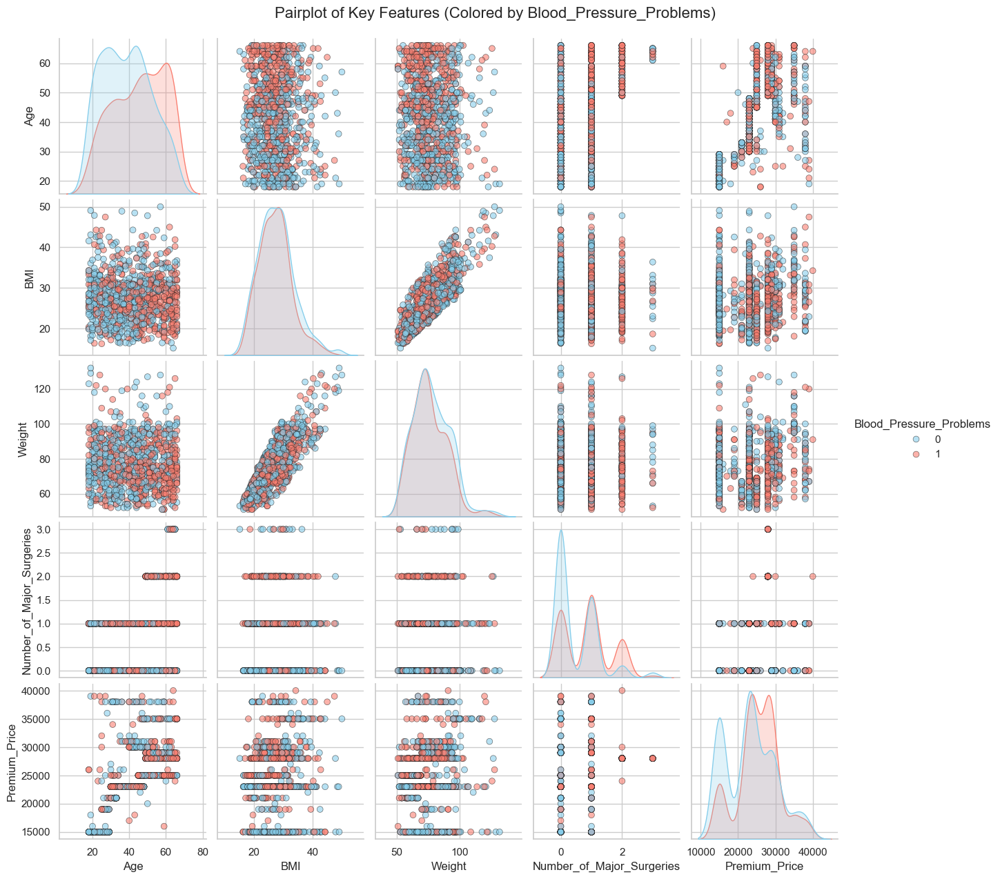

Generating Pairplot for: Any_Transplants...


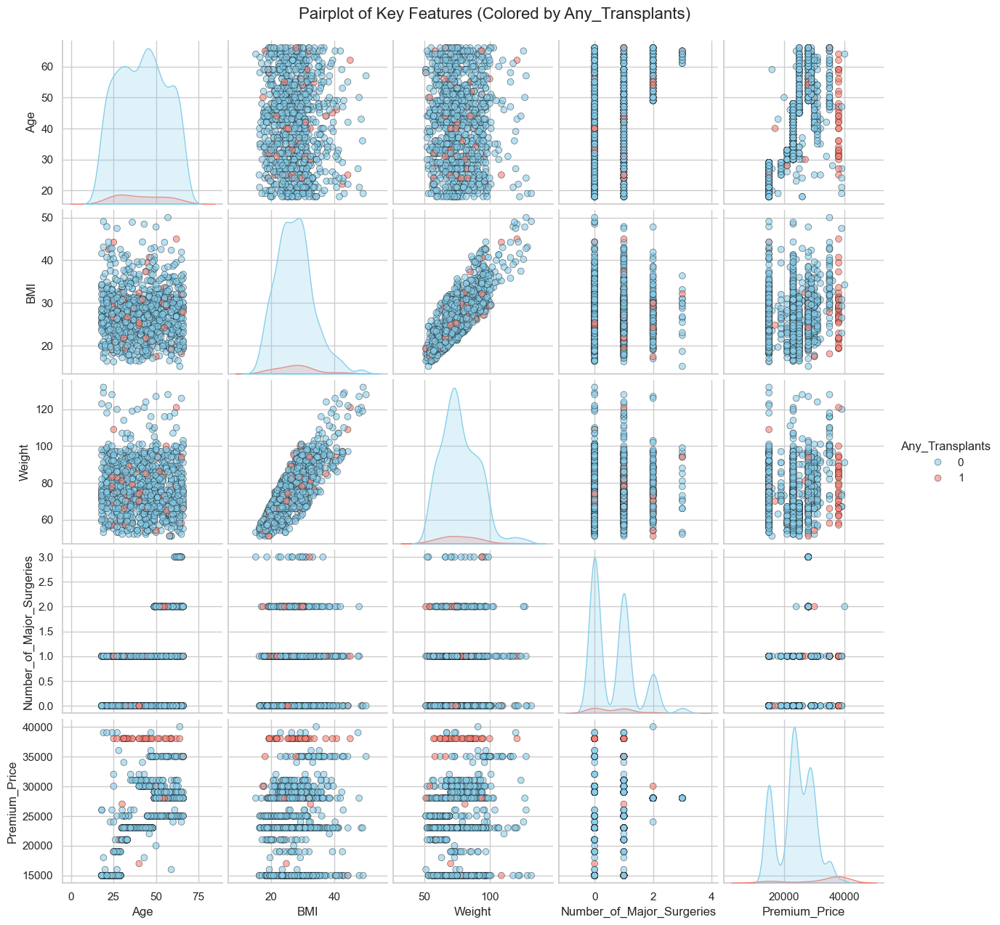

Generating Pairplot for: Any_Chronic_Diseases...


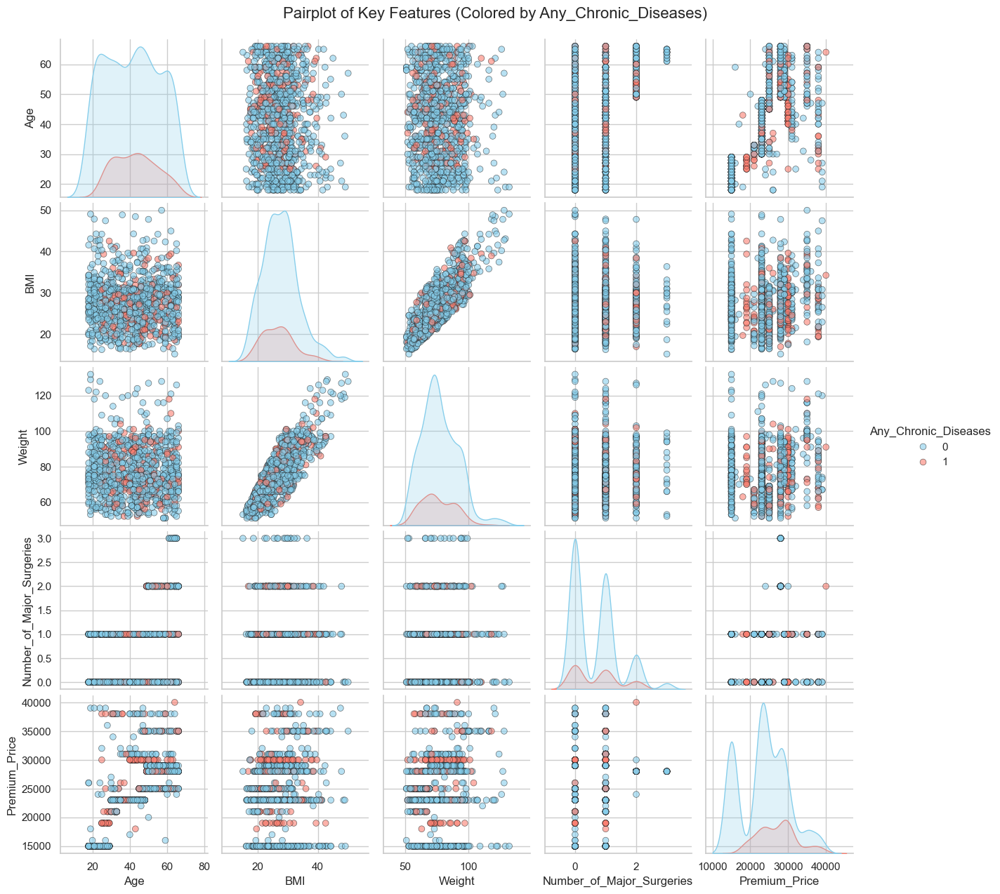

Generating Pairplot for: Known_Allergies...


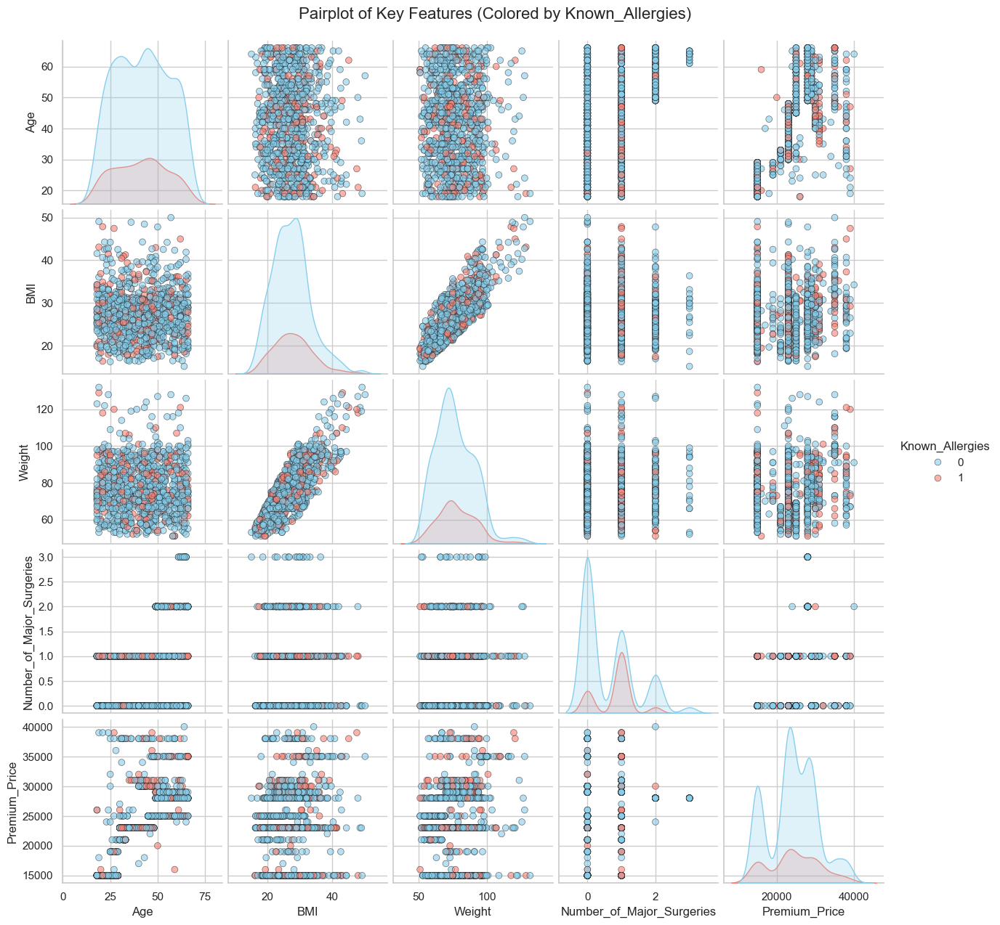

Generating Pairplot for: History_of_Cancer_in_Family...


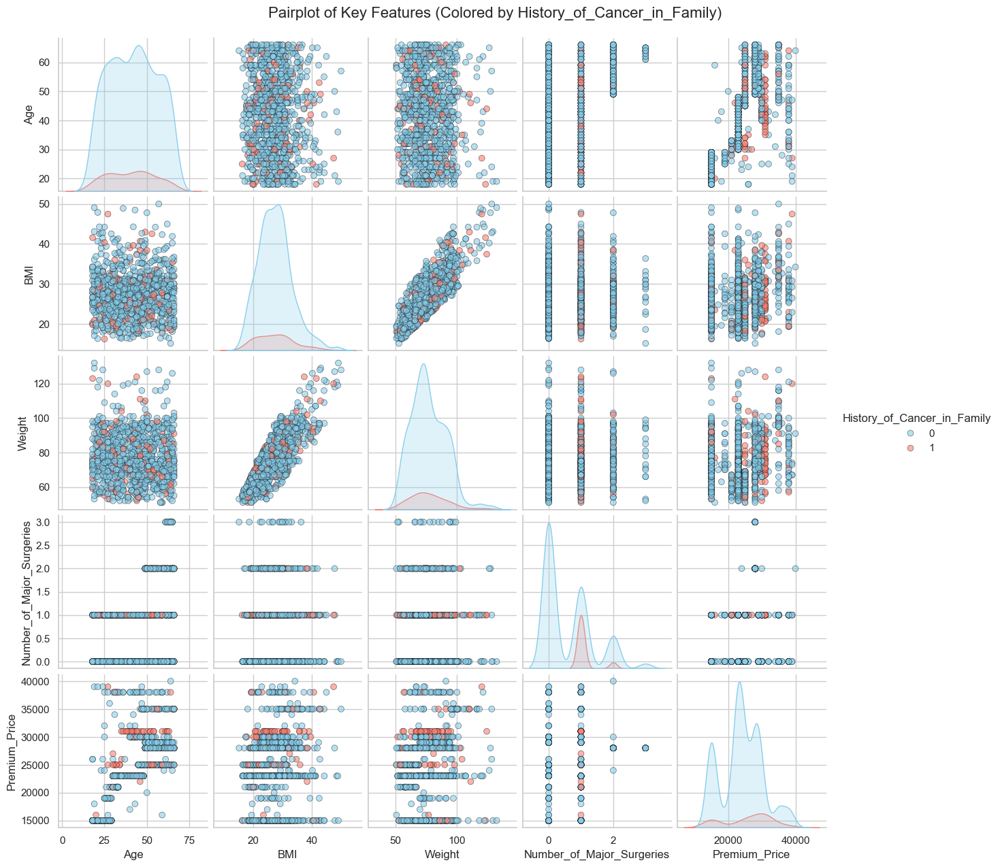

In [27]:
# Pairplots for Key Features (with all binary columns)

# numeric features for pairplot
pairplot_cols = ['Age', 'BMI', 'Weight', 'Number_of_Major_Surgeries', 'Premium_Price']

# binary columns (all except Premium_Price, Age, Height, Weight, BMI, Surgeries)
binary_cols = ['Diabetes', 'Blood_Pressure_Problems', 'Any_Transplants',
               'Any_Chronic_Diseases', 'Known_Allergies', 'History_of_Cancer_in_Family']

def save_pairplots(df, num_cols, bin_cols, save_path="pairplots"):
    import os
    os.makedirs(save_path, exist_ok=True)  # create folder if not exists

    for col in bin_cols:
        print(f"Generating Pairplot for: {col}...")

        g = sns.pairplot(
            df[num_cols + [col]],
            hue=col,
            diag_kind="kde",
            palette={0: "skyblue", 1: "salmon"},
            plot_kws={'alpha':0.6, 's':40, 'edgecolor':'k'}
        )

        g.fig.suptitle(f"Pairplot of Key Features (Colored by {col})", y=1.02, fontsize=16)

        # save plot
        filename = f"{save_path}/pairplot_{col}.png"
        g.savefig(filename, dpi=150, bbox_inches='tight')
        plt.show()  # also display inline
        plt.close()

# Run the function
save_pairplots(df, pairplot_cols, binary_cols)


## 2.4 - Outlier Analysis

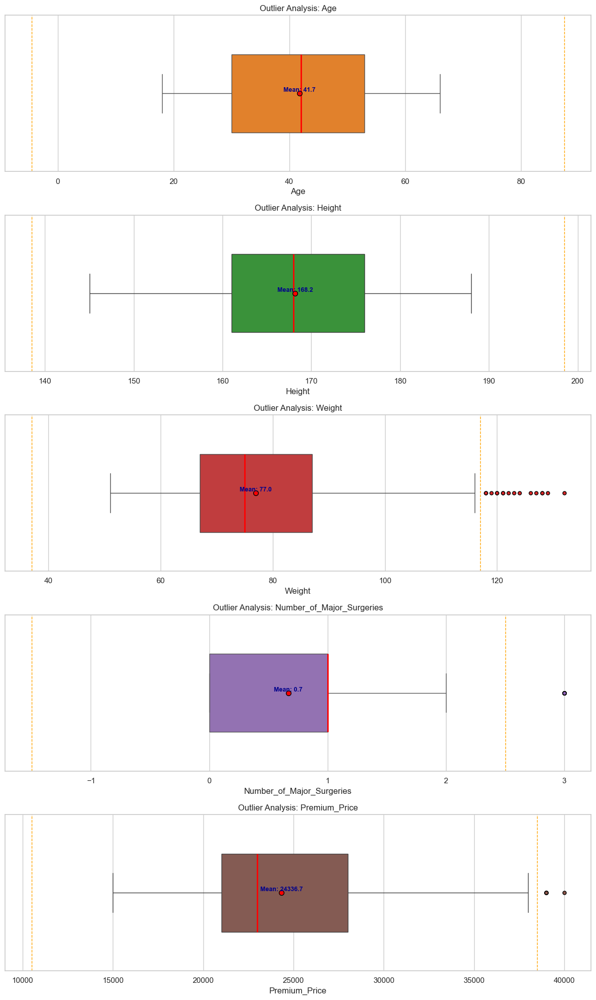

,Lower Bound,Upper Bound,Outlier Count
Age,-4.5,87.5,0.0
Height,138.5,198.5,0.0
Weight,37.0,117.0,16.0
Number_of_Major_Surgeries,-1.5,2.5,16.0
Premium_Price,10500.0,38500.0,6.0


In [28]:
# Outlier Analysis

# Continuous variables
cont_cols = ['Age', 'Height', 'Weight', 'Number_of_Major_Surgeries', 'Premium_Price']

# Custom Colors
Colors_Palette = ["#1f77b4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd", "#8c564b"]

# Dictionary to store outlier counts
outlier_summary = {}

plt.figure(figsize=(12, 4*len(cont_cols)))  # one row per boxplot

for i, col in enumerate(cont_cols, 1):
    plt.subplot(len(cont_cols), 1, i)
    plt.title(f"Outlier Analysis: {col}", fontsize=12)

    # Boxplot (horizontal)
    sns.boxplot(
        data=df,
        x=col,
        color=Colors_Palette[i % len(Colors_Palette)],
        width=0.5,
        fliersize=5,
        #notch=True,
        showcaps=True,
        linewidth=1,
        showmeans=True,
        meanprops={'marker': 'o',
                   'markerfacecolor': 'red',
                   'markeredgecolor': 'black',
                   'markersize': 7},
        medianprops={"color": "red", "linewidth": 2},
        flierprops={'marker': 'o',
                    'markersize': 5,
                    'markerfacecolor': Colors_Palette[i % len(Colors_Palette)],
                    'markeredgecolor': 'black',
                    "linewidth": 1.5}
    )
    
    # --- Add Mean Value Annotation ---
    mean_val = df[col].mean()
    plt.text(mean_val, 0, f"Mean: {mean_val:.1f}", ha='center', va='bottom',
             fontsize=9, fontweight="bold", color="darkblue")

    # --- Outlier Detection ---
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound, upper_bound = Q1 - 1.5*IQR, Q3 + 1.5*IQR

    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)][col]
    outlier_summary[col] = {
        "Lower Bound": lower_bound,
        "Upper Bound": upper_bound,
        "Outlier Count": outliers.shape[0]
    }

    # Add IQR lines
    plt.axvline(lower_bound, color="orange", linestyle="--", lw=1)
    plt.axvline(upper_bound, color="orange", linestyle="--", lw=1)

plt.tight_layout()
plt.show()

# Convert outlier summary into a nice DataFrame
outlier_df = pd.DataFrame(outlier_summary).T
display(outlier_df)


# Z-Score & IQR

# Hypothesis Testing

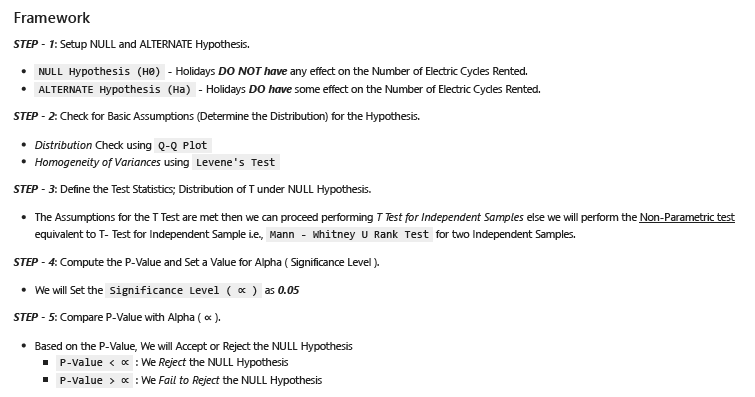

In [29]:
# Hypothesis Testing Framework for Binary Features

def hypothesis_tests_framework(df, binary_cols, target='Premium_Price', alpha=0.05):
    for col in binary_cols:
        print("="*80)
        print(f" Feature: {col} vs {target}")
        print("="*80)

        # Split into two groups
        group0 = df[df[col] == 0][target]
        group1 = df[df[col] == 1][target]

        # Step 1: State Hypothesis
        print("\nSTEP 1: Setup NULL and ALTERNATE Hypothesis")
        print(f"H0: {col} has NO effect on {target}")
        print(f"Ha: {col} DOES have an effect on {target}")

        # Step 2: Normality (Shapiro-Wilk)
        print("\nSTEP 2: Check for Normality (Shapiro-Wilk Test)")
        stat0, p0 = stats.shapiro(group0)
        stat1, p1 = stats.shapiro(group1)
        print(f"Shapiro Test for {col}=0 → p-value = {p0:.4f}")
        print(f"Shapiro Test for {col}=1 → p-value = {p1:.4f}")
        norm0, norm1 = p0 > alpha, p1 > alpha

        # Step 3: Homogeneity of Variance (Levene’s Test)
        print("\nSTEP 3: Check for Homogeneity of Variances (Levene’s Test)")
        stat_lev, p_lev = stats.levene(group0, group1)
        print(f"Levene’s Test p-value = {p_lev:.4f}")
        homogeneity = p_lev > alpha

        # Step 4: Select Test
        print("\nSTEP 4: Choose Appropriate Test")
        if norm0 and norm1 and homogeneity:
            test_name = "Independent t-test"
            stat_test, p_test = stats.ttest_ind(group0, group1, equal_var=True)
        else:
            test_name = "Mann–Whitney U Test"
            stat_test, p_test = stats.mannwhitneyu(group0, group1, alternative='two-sided')

        print(f"Selected Test: {test_name}")
        print(f"Test Statistic = {stat_test:.4f}, p-value = {p_test:.4f}")

        # Step 5: Decision
        print("\nSTEP 5: Decision at α = 0.05")
        if p_test < alpha:
            print(f"❌ Reject H0 → {col} has a statistically significant effect on {target}.")
        else:
            print(f"✔ Fail to Reject H0 → No significant effect of {col} on {target}.")
        print("\n\n")

# Run the framework
binary_cols = ['Diabetes', 'Blood_Pressure_Problems', 'Any_Transplants',
               'Any_Chronic_Diseases', 'Known_Allergies', 
               'History_of_Cancer_in_Family']

hypothesis_tests_framework(df, binary_cols)

 Feature: Diabetes vs Premium_Price

STEP 1: Setup NULL and ALTERNATE Hypothesis
H0: Diabetes has NO effect on Premium_Price
Ha: Diabetes DOES have an effect on Premium_Price

STEP 2: Check for Normality (Shapiro-Wilk Test)
Shapiro Test for Diabetes=0 → p-value = 0.0000
Shapiro Test for Diabetes=1 → p-value = 0.0000

STEP 3: Check for Homogeneity of Variances (Levene’s Test)
Levene’s Test p-value = 0.0081

STEP 4: Choose Appropriate Test
Selected Test: Mann–Whitney U Test
Test Statistic = 106563.5000, p-value = 0.0065

STEP 5: Decision at α = 0.05
❌ Reject H0 → Diabetes has a statistically significant effect on Premium_Price.



 Feature: Blood_Pressure_Problems vs Premium_Price

STEP 1: Setup NULL and ALTERNATE Hypothesis
H0: Blood_Pressure_Problems has NO effect on Premium_Price
Ha: Blood_Pressure_Problems DOES have an effect on Premium_Price

STEP 2: Check for Normality (Shapiro-Wilk Test)
Shapiro Test for Blood_Pressure_Problems=0 → p-value = 0.0000
Shapiro Test for Blood_Pressure_

### Separate Transformation Snippet (optional exploration)

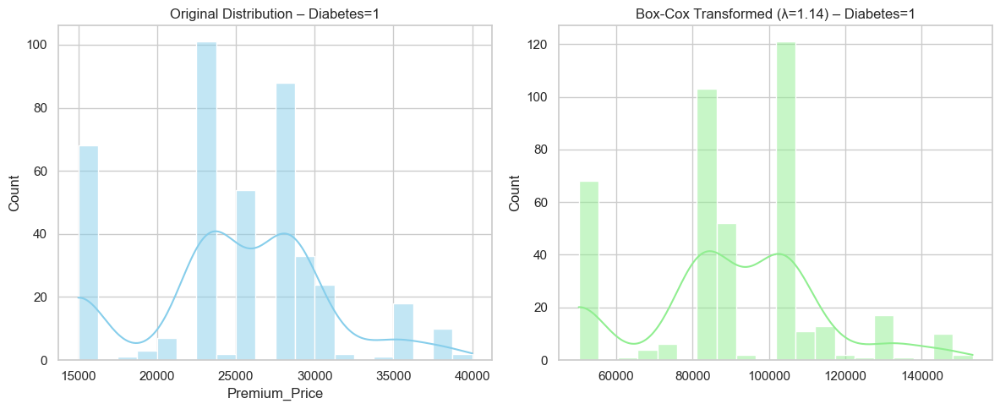

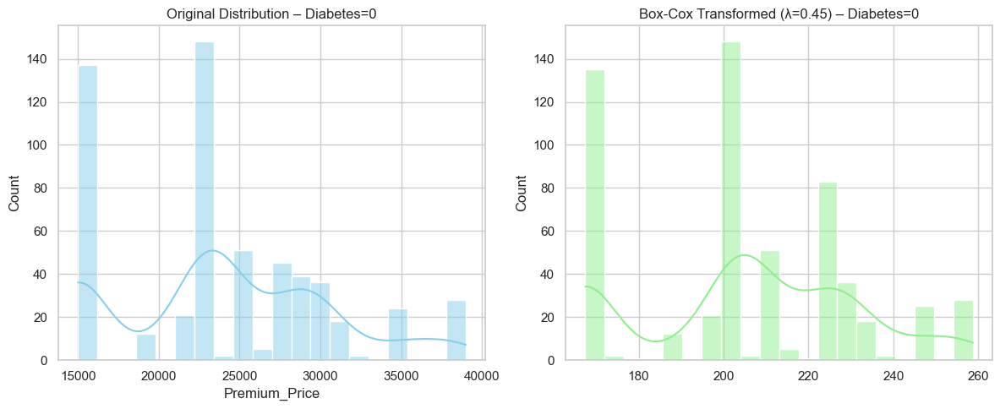

In [31]:
# Box-Cox Transformation Exploration

from scipy.stats import boxcox

def explore_boxcox(data, target_col, group_col, group_val):
    """
    Applies Box-Cox transformation on the target column 
    for a specific group in the group_col.
    
    Args:
        data (pd.DataFrame): dataset
        target_col (str): target numeric column (e.g. 'Premium_Price')
        group_col (str): binary/categorical feature (e.g. 'Diabetes')
        group_val (int): which group to filter (0 or 1)
    """
    subset = data[data[group_col] == group_val][target_col]
    
    if subset.min() <= 0:
        print(f"⚠ Box-Cox requires strictly positive values. "
              f"Shift data before applying for {group_col}={group_val}")
        return
    
    transformed, lam = boxcox(subset)
    
    # Compare before vs after
    fig, axes = plt.subplots(1, 2, figsize=(12,5))
    
    sns.histplot(subset, bins=20, ax=axes[0], kde=True, color="skyblue")
    axes[0].set_title(f"Original Distribution – {group_col}={group_val}")
    
    sns.histplot(transformed, bins=20, ax=axes[1], kde=True, color="lightgreen")
    axes[1].set_title(f"Box-Cox Transformed (λ={lam:.2f}) – {group_col}={group_val}")
    
    plt.tight_layout()
    plt.show()
    
    return lam

# ✅ Example usage
lam_diabetes1 = explore_boxcox(df, 'Premium_Price', 'Diabetes', 1)
lam_diabetes0 = explore_boxcox(df, 'Premium_Price', 'Diabetes', 0)



🔎 Checking Diabetes ...
  Shapiro Diabetes=0: W=0.921, p=0.0000
   ❌ Not normal → trying Box-Cox


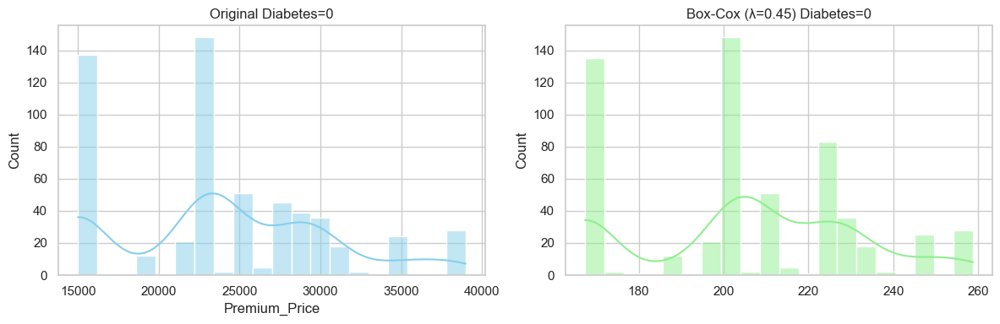

  Shapiro Diabetes=1: W=0.923, p=0.0000
   ❌ Not normal → trying Box-Cox


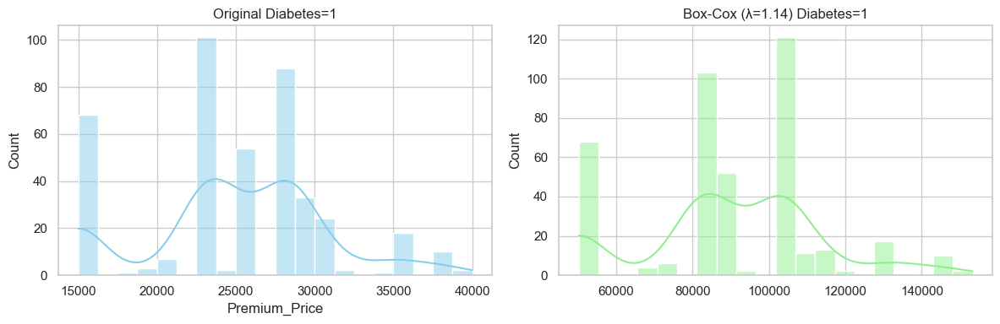


🔎 Checking Blood_Pressure_Problems ...
  Shapiro Blood_Pressure_Problems=0: W=0.906, p=0.0000
   ❌ Not normal → trying Box-Cox


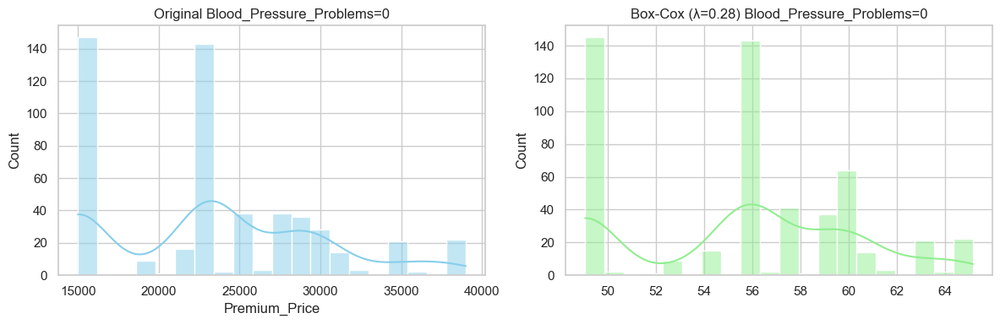

  Shapiro Blood_Pressure_Problems=1: W=0.935, p=0.0000
   ❌ Not normal → trying Box-Cox


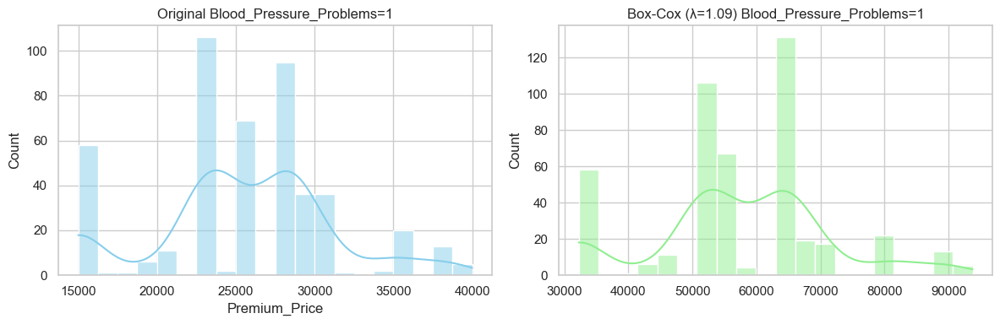


🔎 Checking Any_Transplants ...
  Shapiro Any_Transplants=0: W=0.920, p=0.0000
   ❌ Not normal → trying Box-Cox


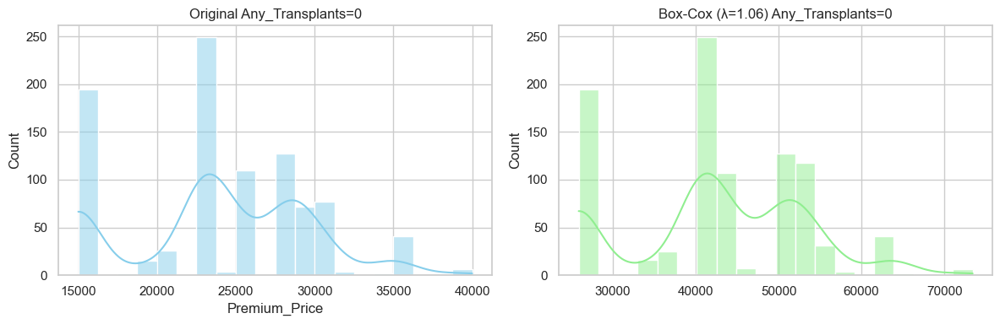

  Shapiro Any_Transplants=1: W=0.663, p=0.0000
   ❌ Not normal → trying Box-Cox


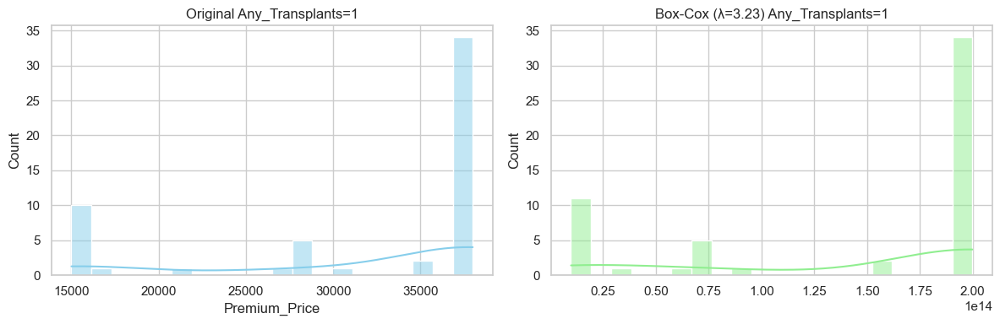


🔎 Checking Any_Chronic_Diseases ...
  Shapiro Any_Chronic_Diseases=0: W=0.910, p=0.0000
   ❌ Not normal → trying Box-Cox


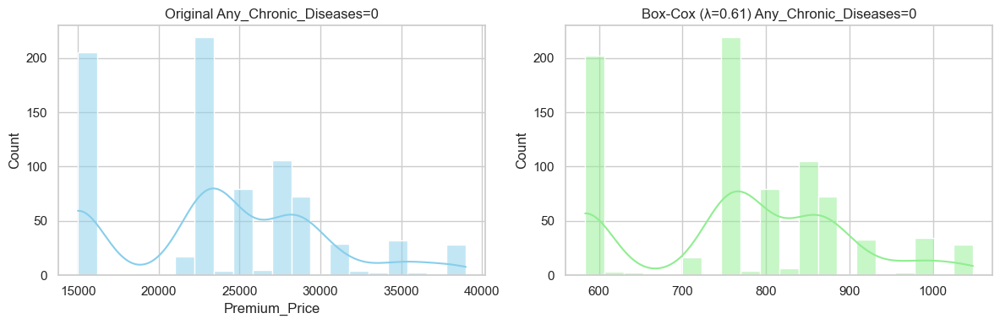

  Shapiro Any_Chronic_Diseases=1: W=0.940, p=0.0000
   ❌ Not normal → trying Box-Cox


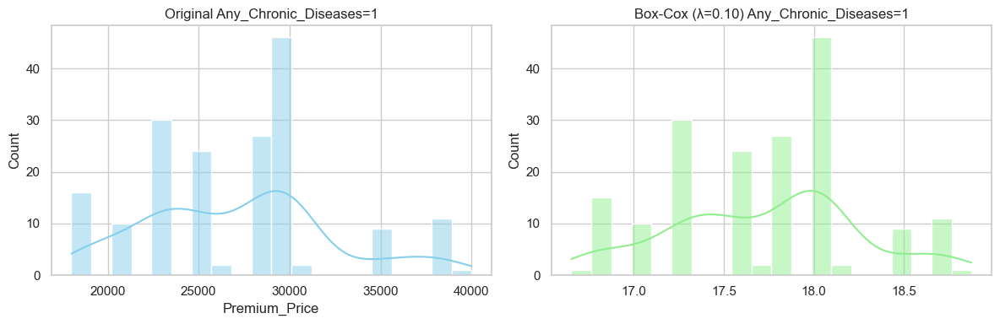


🔎 Checking Known_Allergies ...
  Shapiro Known_Allergies=0: W=0.925, p=0.0000
   ❌ Not normal → trying Box-Cox


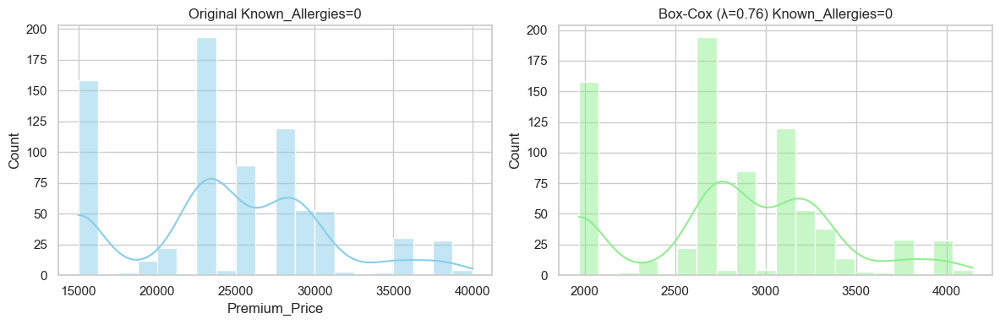

  Shapiro Known_Allergies=1: W=0.927, p=0.0000
   ❌ Not normal → trying Box-Cox


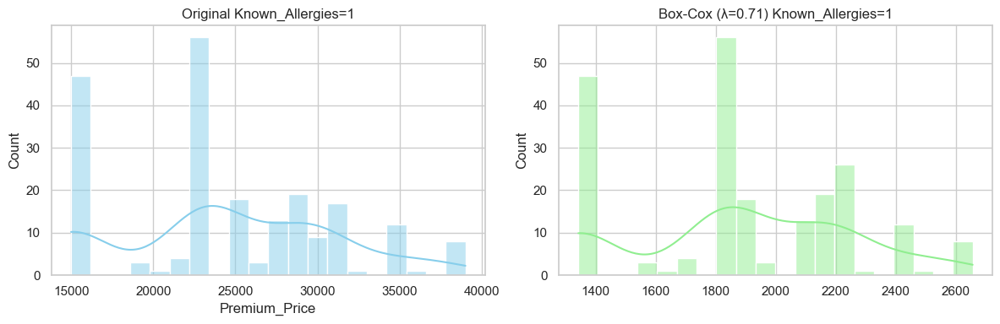


🔎 Checking History_of_Cancer_in_Family ...
  Shapiro History_of_Cancer_in_Family=0: W=0.921, p=0.0000
   ❌ Not normal → trying Box-Cox


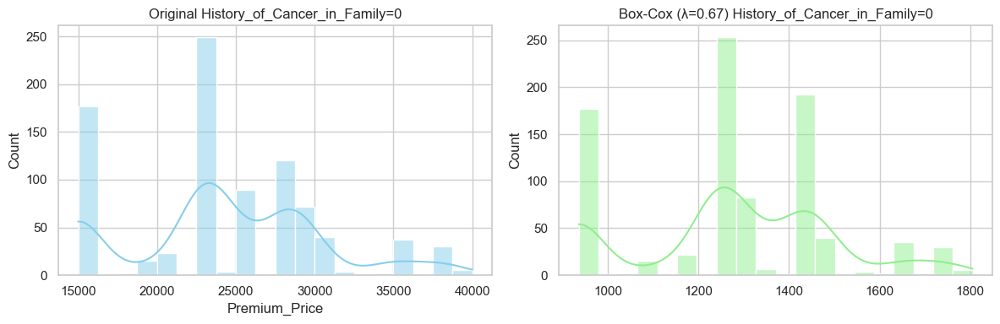

  Shapiro History_of_Cancer_in_Family=1: W=0.876, p=0.0000
   ❌ Not normal → trying Box-Cox


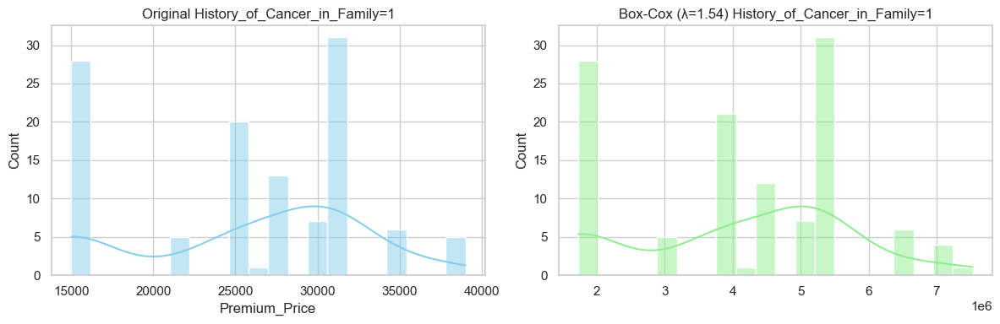

In [32]:
from scipy.stats import boxcox, shapiro
import matplotlib.pyplot as plt
import seaborn as sns

def explore_boxcox_auto(data, target_col, binary_cols, alpha=0.05):
    """
    Automatically checks normality & applies Box-Cox transformation
    for each binary variable's groups.
    
    Args:
        data (pd.DataFrame): dataset
        target_col (str): target numeric column (e.g. 'Premium_Price')
        binary_cols (list): list of binary feature names
        alpha (float): significance level for Shapiro-Wilk test
    """
    results = {}

    for col in binary_cols:
        print(f"\n🔎 Checking {col} ...")

        for val in sorted(data[col].unique()):
            subset = data[data[col] == val][target_col]
            
            if len(subset) < 10:
                print(f"⚠ Skipping {col}={val} (too few samples)")
                continue
            
            # Normality check
            stat, p = shapiro(subset)
            print(f"  Shapiro {col}={val}: W={stat:.3f}, p={p:.4f}")
            
            if p < alpha:
                print(f"   ❌ Not normal → trying Box-Cox")
                if subset.min() <= 0:
                    print(f"   ⚠ Skipping Box-Cox (values not strictly positive)")
                    continue

                transformed, lam = boxcox(subset)
                results[(col, val)] = lam
                
                # Plot before vs after
                fig, axes = plt.subplots(1, 2, figsize=(12, 4))
                sns.histplot(subset, bins=20, kde=True, ax=axes[0], color="skyblue")
                axes[0].set_title(f"Original {col}={val}")

                sns.histplot(transformed, bins=20, kde=True, ax=axes[1], color="lightgreen")
                axes[1].set_title(f"Box-Cox (λ={lam:.2f}) {col}={val}")
                
                plt.tight_layout()
                plt.show()
            else:
                print(f"   ✅ Normal → No transformation needed")

    return results

# ✅ Run for all binary features
binary_cols = ['Diabetes', 'Blood_Pressure_Problems', 'Any_Transplants',
               'Any_Chronic_Diseases', 'Known_Allergies', 
               'History_of_Cancer_in_Family']

boxcox_results = explore_boxcox_auto(df, 'Premium_Price', binary_cols)



🔎 Checking Diabetes ...
  Shapiro Diabetes=0: W=0.921, p=0.0000
   ❌ Not normal → trying Box-Cox


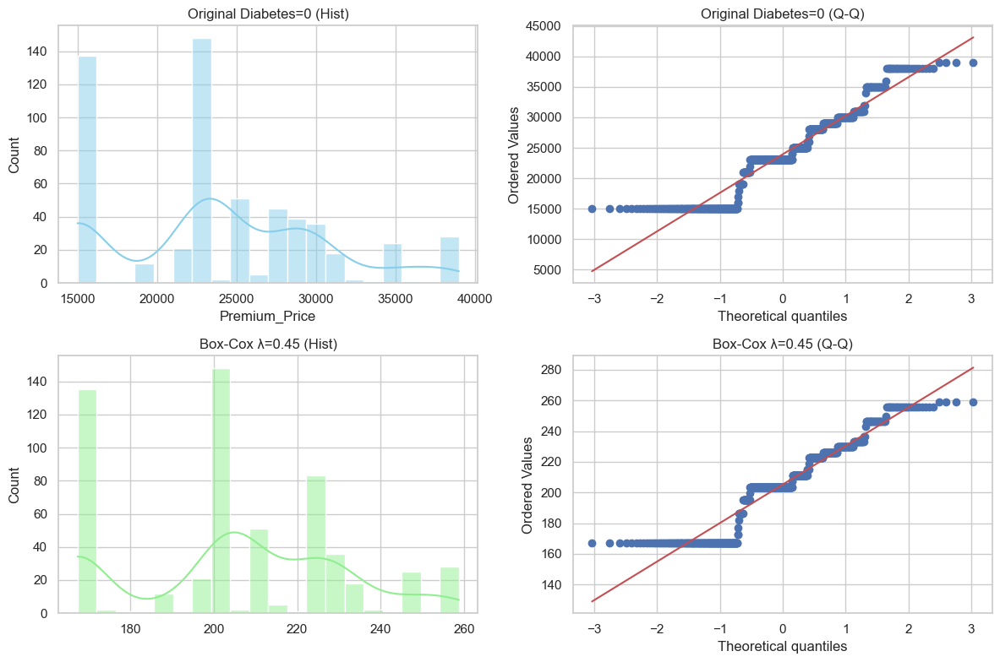

  Shapiro Diabetes=1: W=0.923, p=0.0000
   ❌ Not normal → trying Box-Cox


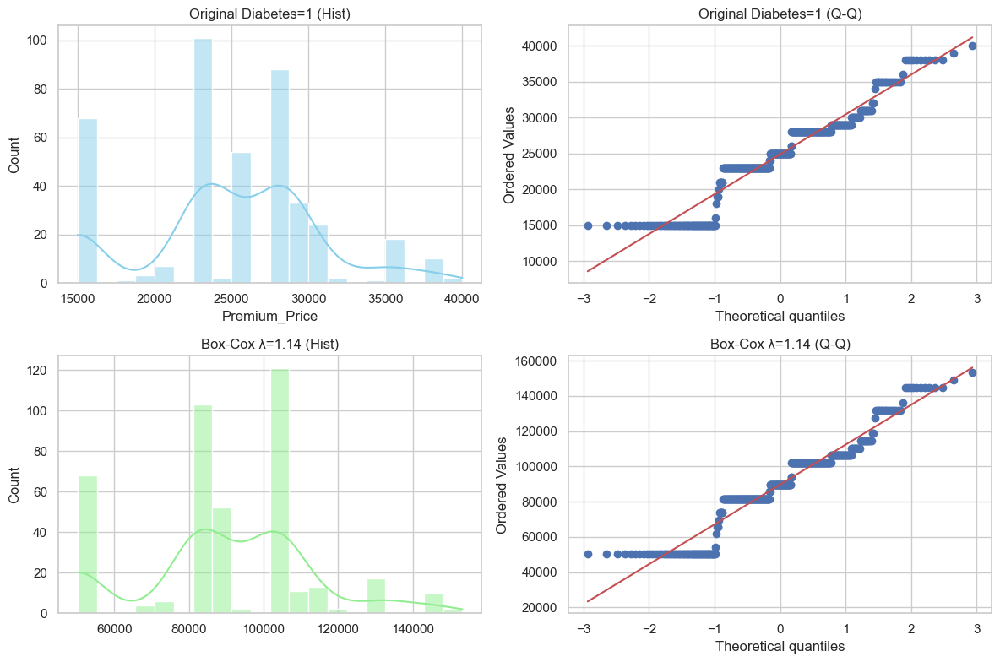


🔎 Checking Blood_Pressure_Problems ...
  Shapiro Blood_Pressure_Problems=0: W=0.906, p=0.0000
   ❌ Not normal → trying Box-Cox


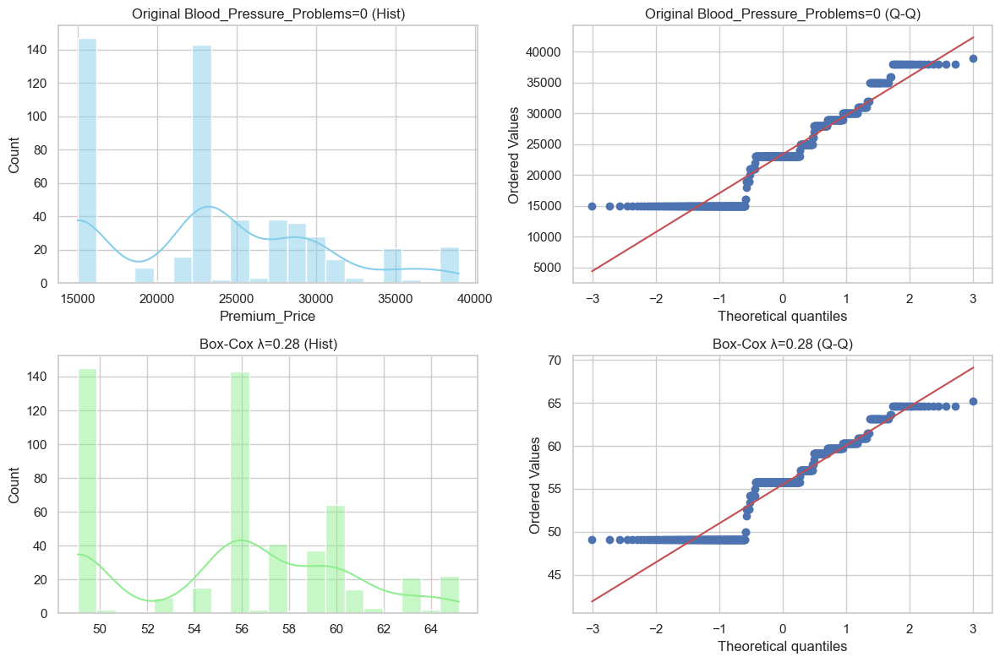

  Shapiro Blood_Pressure_Problems=1: W=0.935, p=0.0000
   ❌ Not normal → trying Box-Cox


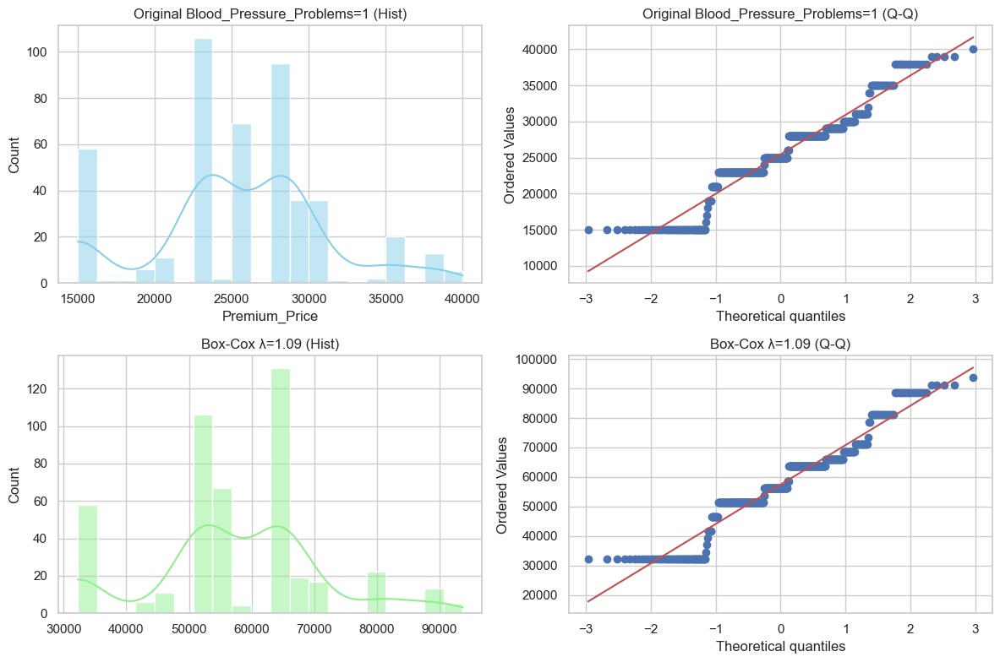


🔎 Checking Any_Transplants ...
  Shapiro Any_Transplants=0: W=0.920, p=0.0000
   ❌ Not normal → trying Box-Cox


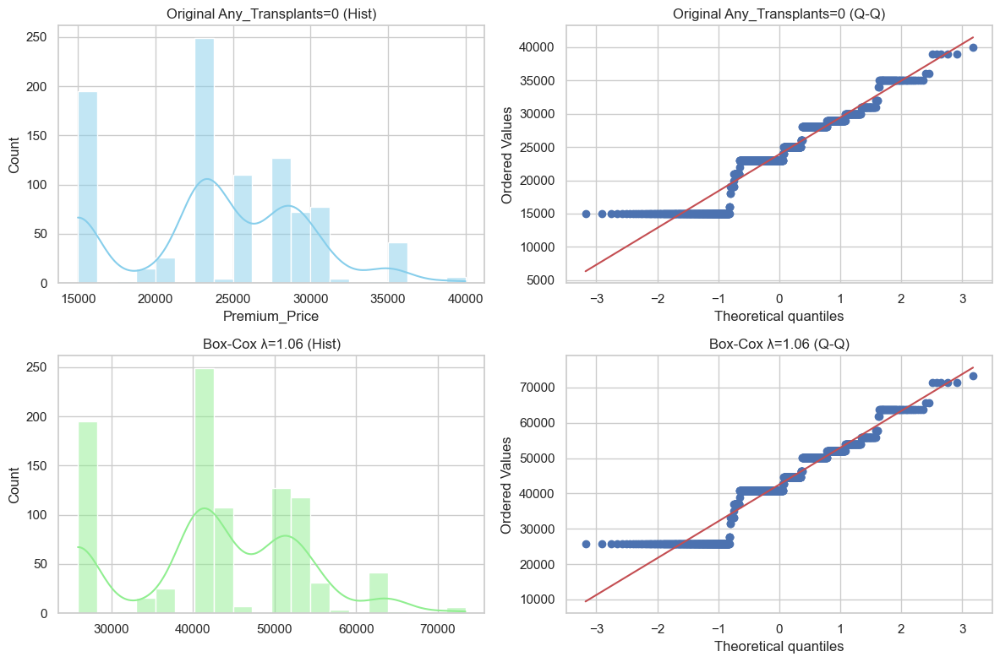

  Shapiro Any_Transplants=1: W=0.663, p=0.0000
   ❌ Not normal → trying Box-Cox


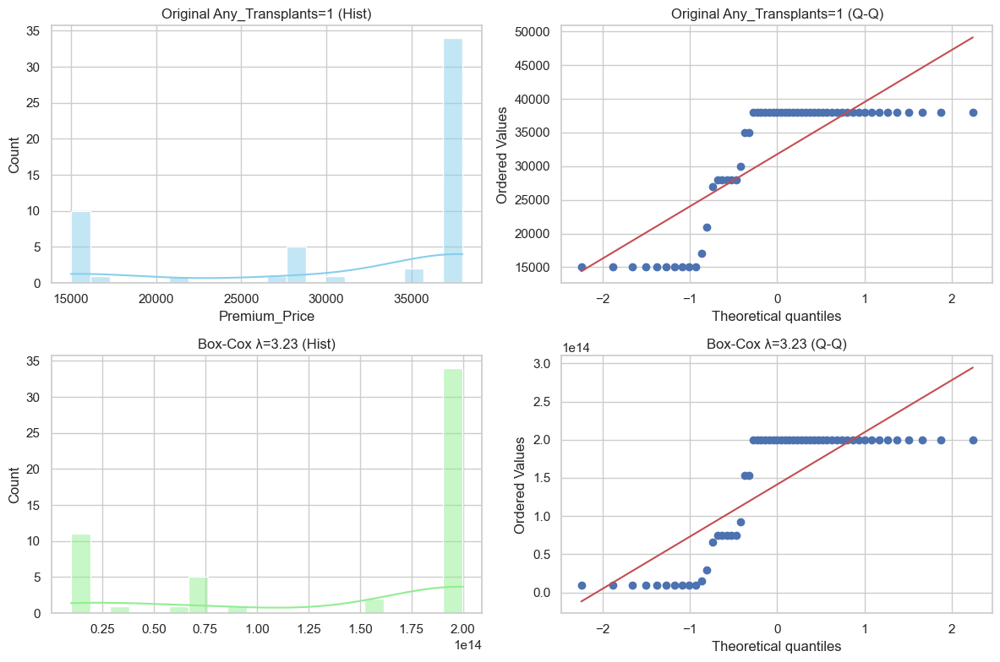


🔎 Checking Any_Chronic_Diseases ...
  Shapiro Any_Chronic_Diseases=0: W=0.910, p=0.0000
   ❌ Not normal → trying Box-Cox


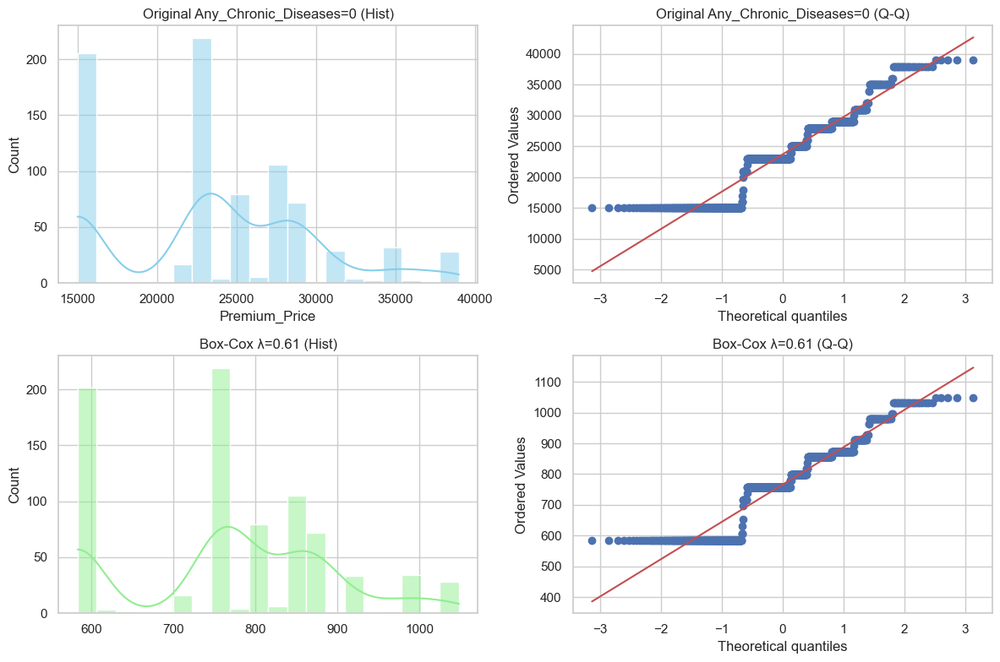

  Shapiro Any_Chronic_Diseases=1: W=0.940, p=0.0000
   ❌ Not normal → trying Box-Cox


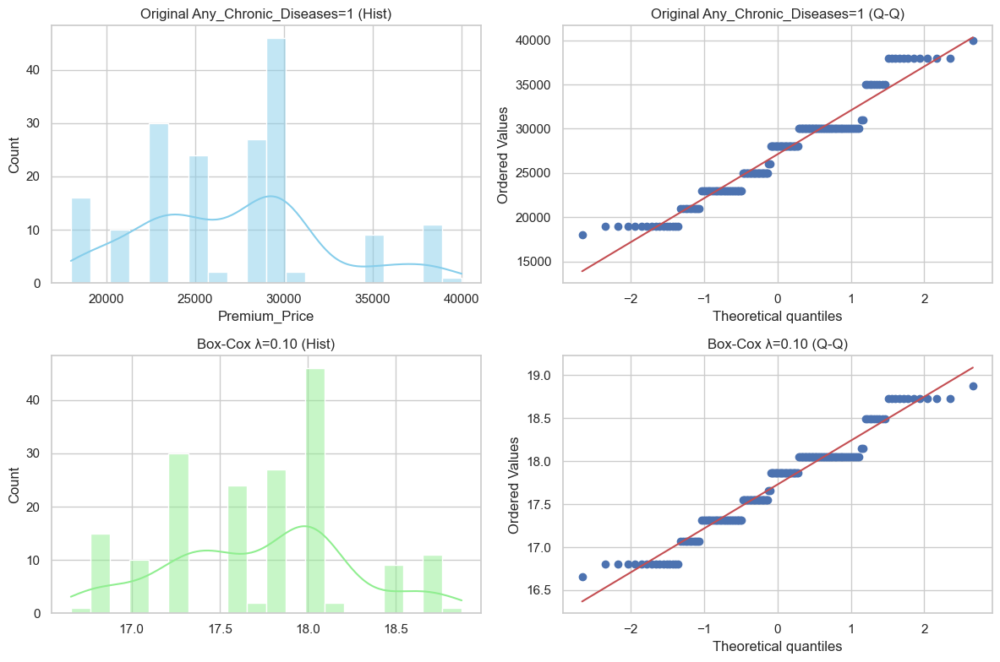


🔎 Checking Known_Allergies ...
  Shapiro Known_Allergies=0: W=0.925, p=0.0000
   ❌ Not normal → trying Box-Cox


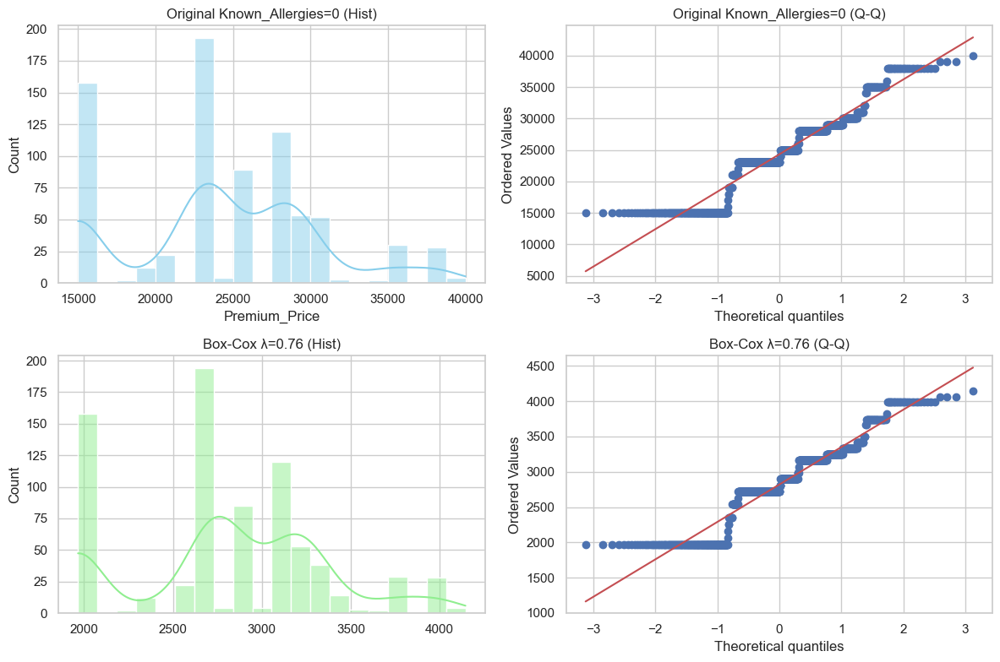

  Shapiro Known_Allergies=1: W=0.927, p=0.0000
   ❌ Not normal → trying Box-Cox


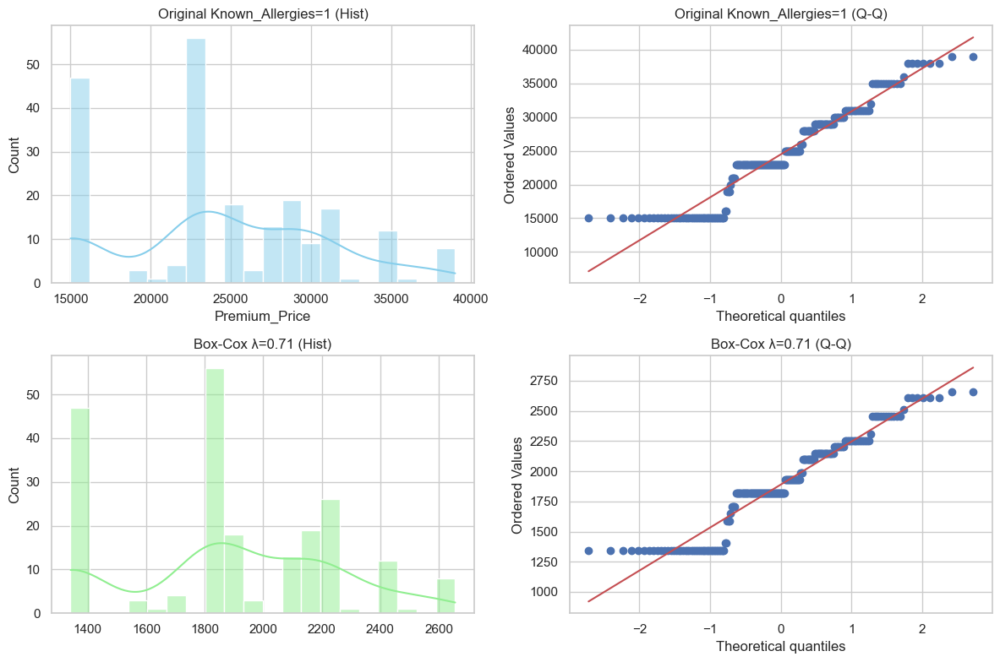


🔎 Checking History_of_Cancer_in_Family ...
  Shapiro History_of_Cancer_in_Family=0: W=0.921, p=0.0000
   ❌ Not normal → trying Box-Cox


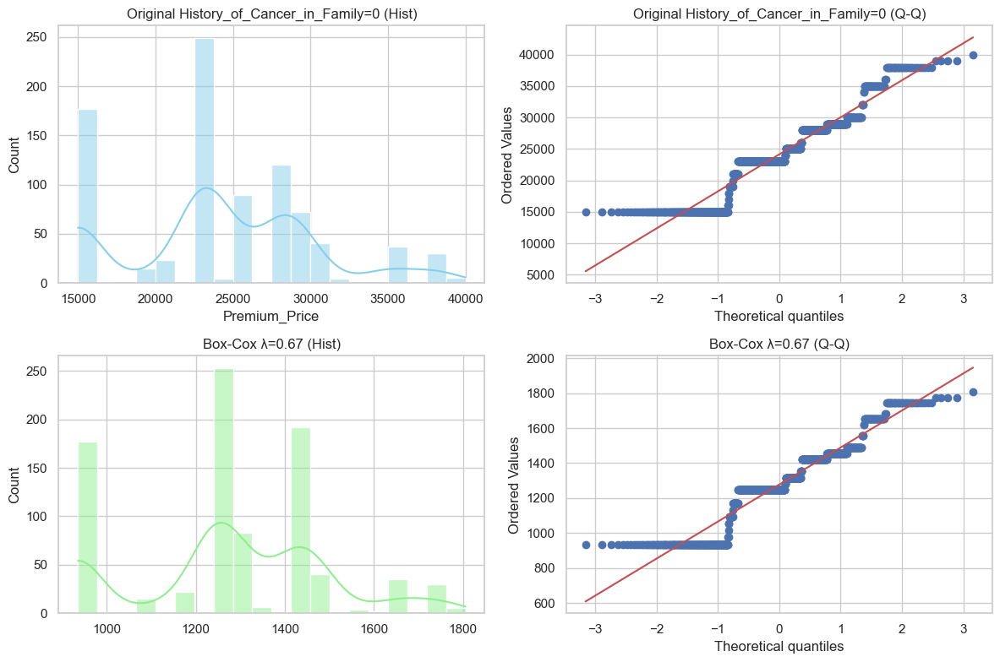

  Shapiro History_of_Cancer_in_Family=1: W=0.876, p=0.0000
   ❌ Not normal → trying Box-Cox


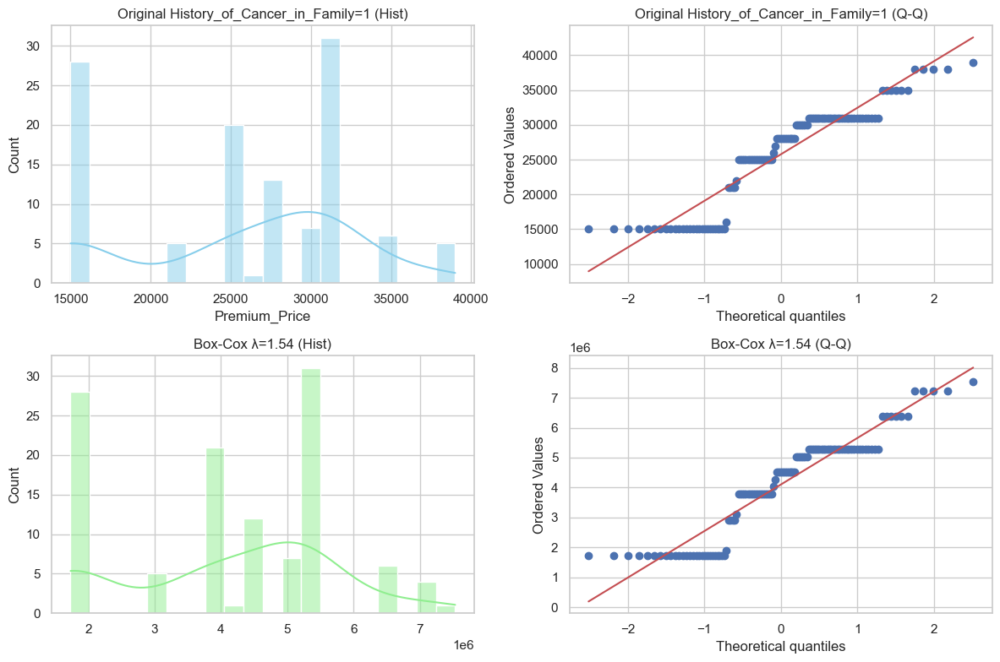

In [33]:
from scipy.stats import boxcox, shapiro, probplot
import matplotlib.pyplot as plt
import seaborn as sns

def explore_boxcox_auto(data, target_col, binary_cols, alpha=0.05):
    """
    Automatically checks normality & applies Box-Cox transformation
    for each binary variable's groups, with Hist + Q-Q Plots.
    
    Args:
        data (pd.DataFrame): dataset
        target_col (str): target numeric column (e.g. 'Premium_Price')
        binary_cols (list): list of binary feature names
        alpha (float): significance level for Shapiro-Wilk test
    """
    results = {}

    for col in binary_cols:
        print(f"\n🔎 Checking {col} ...")

        for val in sorted(data[col].unique()):
            subset = data[data[col] == val][target_col]
            
            if len(subset) < 10:
                print(f"⚠ Skipping {col}={val} (too few samples)")
                continue
            
            # --- Normality check ---
            stat, p = shapiro(subset)
            print(f"  Shapiro {col}={val}: W={stat:.3f}, p={p:.4f}")
            
            if p < alpha:
                print(f"   ❌ Not normal → trying Box-Cox")
                if subset.min() <= 0:
                    print(f"   ⚠ Skipping Box-Cox (values not strictly positive)")
                    continue

                transformed, lam = boxcox(subset)
                results[(col, val)] = lam

                # Plot: Original vs Box-Cox (Hist + Q-Q)
                fig, axes = plt.subplots(2, 2, figsize=(12, 8))

                # Original Histogram
                sns.histplot(subset, bins=20, kde=True, ax=axes[0,0], color="skyblue")
                axes[0,0].set_title(f"Original {col}={val} (Hist)")

                # Original Q-Q plot
                probplot(subset, dist="norm", plot=axes[0,1])
                axes[0,1].set_title(f"Original {col}={val} (Q-Q)")

                # Box-Cox Histogram
                sns.histplot(transformed, bins=20, kde=True, ax=axes[1,0], color="lightgreen")
                axes[1,0].set_title(f"Box-Cox λ={lam:.2f} (Hist)")

                # Box-Cox Q-Q plot
                probplot(transformed, dist="norm", plot=axes[1,1])
                axes[1,1].set_title(f"Box-Cox λ={lam:.2f} (Q-Q)")

                plt.tight_layout()
                plt.show()
            else:
                print(f"   ✅ Normal → No transformation needed")

    return results

# ✅ Run for all binary features
binary_cols = ['Diabetes', 'Blood_Pressure_Problems', 'Any_Transplants',
               'Any_Chronic_Diseases', 'Known_Allergies', 
               'History_of_Cancer_in_Family']

boxcox_results = explore_boxcox_auto(df, 'Premium_Price', binary_cols)
